# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 0ldpxhej
Name: firm-donkey-609
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/0ldpxhej
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_011029-0ldpxhej/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-4c9f6b87-24d0-56dc-8d0c-4b5af0ebfa7b]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 233,382,448,179,405,291,559,132,457,375,432,382,252,279,48,215,452,283,274,508,248,265,146,51,322,152,103,279,94,81,179,205,51,333,240,165,260,135,98,194,377,449,315,987,128,384,173,191,289,300,230,139,371,260,252,377,314,633,290,291,219,603,241,151,261,337,292,721,362,356,270,376,346,357,122,231,229,144,60,124,198,502,294,284,347,217,141,246,387,165,139,105,270,411,146,163,450,79,162,305,175,350,92,254,202,220,339,137,147,301,280,111,118,352,343,364,261,39,46,211,223,256,71,205,330,249,187,235,286,206,974,266,190,501,306,155,494,347,498,457,212,467,469,272,357,243,358,231,301,280,273,242,253,409,406,249,241,193,147,610,244,233,137,143,176,157,539,249,372,215,277,417,611,423,299,255,233,237,173,177,216,193,208,250,606,345,333,354,390,7103,426,277,190,171,355,167,277,277,161,320

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 43,99,110,53,90,88,128,43,125,88,101,82,49,79,11,49,110,82,74,155,58,70,42,13,88,32,31,85,32,26,51,40,13,79,46,46,71,45,16,43,91,117,100,232,51,91,42,50,66,98,55,39,99,68,77,101,73,154,92,75,71,128,56,32,61,88,62,184,79,89,54,83,105,88,37,53,48,47,11,27,49,128,88,61,79,55,51,49,92,51,36,25,59,83,46,37,102,17,31,63,40,113,34,49,35,54,71,30,36,67,69,29,23,93,84,80,66,15,13,55,55,73,25,49,65,62,50,63,75,57,223,71,51,146,69,37,129,85,128,124,49,104,110,66,94,57,86,71,62,86,66,60,66,91,91,64,57,44,45,160,66,60,39,43,39,45,128,66,108,54,68,95,139,90,73,67,51,54,45,45,48,43,47,55,157,89,79,92,73,1804,104,72,55,40,91,50,54,55,39,83,29,67,64,75,78,134,72,60,105,22,18,33,62,56,27,60,77,97,42,38,77,65,64,57,57,55,59,68,50,69,64,89,59,68,16,53,42,153,140,125,89,71,73,66,204,114,26,56,66,

Epoch 1/600:   0%|          | 1/600 [00:22<3:40:22, 22.07s/it]

Epoch 1/600:   0%|          | 1/600 [00:22<3:40:22, 22.07s/it, v_num=ej_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 2/600:   0%|          | 1/600 [00:22<3:40:22, 22.07s/it, v_num=ej_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 2/600:   0%|          | 2/600 [00:30<2:19:57, 14.04s/it, v_num=ej_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 2/600:   0%|          | 2/600 [00:30<2:19:57, 14.04s/it, v_num=ej_1, total_loss_train=1.35e+3, kl_local_train=78.2]

Epoch 3/600:   0%|          | 2/600 [00:30<2:19:57, 14.04s/it, v_num=ej_1, total_loss_train=1.35e+3, kl_local_train=78.2]

Epoch 3/600:   0%|          | 3/600 [00:38<1:54:03, 11.46s/it, v_num=ej_1, total_loss_train=1.35e+3, kl_local_train=78.2]

Epoch 3/600:   0%|          | 3/600 [00:38<1:54:03, 11.46s/it, v_num=ej_1, total_loss_train=1.33e+3, kl_local_train=73]  

Epoch 4/600:   0%|          | 3/600 [00:38<1:54:03, 11.46s/it, v_num=ej_1, total_loss_train=1.33e+3, kl_local_train=73]

Epoch 4/600:   1%|          | 4/600 [00:46<1:39:39, 10.03s/it, v_num=ej_1, total_loss_train=1.33e+3, kl_local_train=73]

Epoch 4/600:   1%|          | 4/600 [00:46<1:39:39, 10.03s/it, v_num=ej_1, total_loss_train=1.32e+3, kl_local_train=58.3]

Epoch 5/600:   1%|          | 4/600 [00:46<1:39:39, 10.03s/it, v_num=ej_1, total_loss_train=1.32e+3, kl_local_train=58.3]

Epoch 5/600:   1%|          | 5/600 [00:55<1:34:35,  9.54s/it, v_num=ej_1, total_loss_train=1.32e+3, kl_local_train=58.3]

Epoch 5/600:   1%|          | 5/600 [00:55<1:34:35,  9.54s/it, v_num=ej_1, total_loss_train=1.31e+3, kl_local_train=35.5]

Epoch 6/600:   1%|          | 5/600 [00:55<1:34:35,  9.54s/it, v_num=ej_1, total_loss_train=1.31e+3, kl_local_train=35.5]

Epoch 6/600:   1%|          | 6/600 [01:03<1:29:42,  9.06s/it, v_num=ej_1, total_loss_train=1.31e+3, kl_local_train=35.5]

Epoch 6/600:   1%|          | 6/600 [01:03<1:29:42,  9.06s/it, v_num=ej_1, total_loss_train=1.3e+3, kl_local_train=40.4] 

Epoch 7/600:   1%|          | 6/600 [01:03<1:29:42,  9.06s/it, v_num=ej_1, total_loss_train=1.3e+3, kl_local_train=40.4]

Epoch 7/600:   1%|          | 7/600 [01:12<1:27:49,  8.89s/it, v_num=ej_1, total_loss_train=1.3e+3, kl_local_train=40.4]

Epoch 7/600:   1%|          | 7/600 [01:12<1:27:49,  8.89s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=43.1]

Epoch 8/600:   1%|          | 7/600 [01:12<1:27:49,  8.89s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=43.1]

Epoch 8/600:   1%|▏         | 8/600 [01:20<1:25:35,  8.68s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=43.1]

Epoch 8/600:   1%|▏         | 8/600 [01:20<1:25:35,  8.68s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=44.8]

Epoch 9/600:   1%|▏         | 8/600 [01:20<1:25:35,  8.68s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=44.8]

Epoch 9/600:   2%|▏         | 9/600 [01:28<1:25:23,  8.67s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=44.8]

Epoch 9/600:   2%|▏         | 9/600 [01:28<1:25:23,  8.67s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=46]  

Epoch 10/600:   2%|▏         | 9/600 [01:28<1:25:23,  8.67s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=46]

Epoch 10/600:   2%|▏         | 10/600 [01:37<1:25:40,  8.71s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=46]

Epoch 10/600:   2%|▏         | 10/600 [01:37<1:25:40,  8.71s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=49.7]

Epoch 11/600:   2%|▏         | 10/600 [01:37<1:25:40,  8.71s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=49.7]

Epoch 11/600:   2%|▏         | 11/600 [01:45<1:23:52,  8.54s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=49.7]

Epoch 11/600:   2%|▏         | 11/600 [01:45<1:23:52,  8.54s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=54.4]

Epoch 12/600:   2%|▏         | 11/600 [01:45<1:23:52,  8.54s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=54.4]

Epoch 12/600:   2%|▏         | 12/600 [01:54<1:24:17,  8.60s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=54.4]

Epoch 12/600:   2%|▏         | 12/600 [01:54<1:24:17,  8.60s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=58]  

Epoch 13/600:   2%|▏         | 12/600 [01:54<1:24:17,  8.60s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=58]

Epoch 13/600:   2%|▏         | 13/600 [02:03<1:23:45,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=58]

Epoch 13/600:   2%|▏         | 13/600 [02:03<1:23:45,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 14/600:   2%|▏         | 13/600 [02:03<1:23:45,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 14/600:   2%|▏         | 14/600 [02:11<1:24:36,  8.66s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=60.9]

Epoch 14/600:   2%|▏         | 14/600 [02:12<1:24:36,  8.66s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 15/600:   2%|▏         | 14/600 [02:12<1:24:36,  8.66s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 15/600:   2%|▎         | 15/600 [02:20<1:23:30,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 15/600:   2%|▎         | 15/600 [02:20<1:23:30,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 16/600:   2%|▎         | 15/600 [02:20<1:23:30,  8.56s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 16/600:   3%|▎         | 16/600 [02:28<1:23:31,  8.58s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 16/600:   3%|▎         | 16/600 [02:28<1:23:31,  8.58s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.8]

Epoch 17/600:   3%|▎         | 16/600 [02:28<1:23:31,  8.58s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.8]

Epoch 17/600:   3%|▎         | 17/600 [02:37<1:23:01,  8.54s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.8]

Epoch 17/600:   3%|▎         | 17/600 [02:37<1:23:01,  8.54s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.5]

Epoch 18/600:   3%|▎         | 17/600 [02:37<1:23:01,  8.54s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.5]

Epoch 18/600:   3%|▎         | 18/600 [02:46<1:24:40,  8.73s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=71.5]

Epoch 18/600:   3%|▎         | 18/600 [02:46<1:24:40,  8.73s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=72.9]

Epoch 19/600:   3%|▎         | 18/600 [02:46<1:24:40,  8.73s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=72.9]

Epoch 19/600:   3%|▎         | 19/600 [02:54<1:22:22,  8.51s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=72.9]

Epoch 19/600:   3%|▎         | 19/600 [02:54<1:22:22,  8.51s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=74.3]

Epoch 20/600:   3%|▎         | 19/600 [02:54<1:22:22,  8.51s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=74.3]

Epoch 20/600:   3%|▎         | 20/600 [03:03<1:23:57,  8.68s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=74.3]

Epoch 20/600:   3%|▎         | 20/600 [03:03<1:23:57,  8.68s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80.4]

Epoch 21/600:   3%|▎         | 20/600 [03:03<1:23:57,  8.68s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80.4]

Epoch 21/600:   4%|▎         | 21/600 [03:12<1:24:07,  8.72s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80.4]

Epoch 21/600:   4%|▎         | 21/600 [03:12<1:24:07,  8.72s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=79.2]

Epoch 22/600:   4%|▎         | 21/600 [03:12<1:24:07,  8.72s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=79.2]

Epoch 22/600:   4%|▎         | 22/600 [03:20<1:22:15,  8.54s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=79.2]

Epoch 22/600:   4%|▎         | 22/600 [03:20<1:22:15,  8.54s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 23/600:   4%|▎         | 22/600 [03:20<1:22:15,  8.54s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 23/600:   4%|▍         | 23/600 [03:28<1:20:00,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 23/600:   4%|▍         | 23/600 [03:28<1:20:00,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=81.5]

Epoch 24/600:   4%|▍         | 23/600 [03:28<1:20:00,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=81.5]

Epoch 24/600:   4%|▍         | 24/600 [03:36<1:18:16,  8.15s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=81.5]

Epoch 24/600:   4%|▍         | 24/600 [03:36<1:18:16,  8.15s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85]  

Epoch 25/600:   4%|▍         | 24/600 [03:36<1:18:16,  8.15s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85]

Epoch 25/600:   4%|▍         | 25/600 [03:45<1:20:35,  8.41s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85]

Epoch 25/600:   4%|▍         | 25/600 [03:45<1:20:35,  8.41s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.6]

Epoch 26/600:   4%|▍         | 25/600 [03:45<1:20:35,  8.41s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.6]

Epoch 26/600:   4%|▍         | 26/600 [03:53<1:20:46,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.6]

Epoch 26/600:   4%|▍         | 26/600 [03:53<1:20:46,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 27/600:   4%|▍         | 26/600 [03:53<1:20:46,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 27/600:   4%|▍         | 27/600 [04:02<1:20:51,  8.47s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=82.8]

Epoch 27/600:   4%|▍         | 27/600 [04:02<1:20:51,  8.47s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.7]

Epoch 28/600:   4%|▍         | 27/600 [04:02<1:20:51,  8.47s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.7]

Epoch 28/600:   5%|▍         | 28/600 [04:10<1:20:31,  8.45s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.7]

Epoch 28/600:   5%|▍         | 28/600 [04:10<1:20:31,  8.45s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.6]

Epoch 29/600:   5%|▍         | 28/600 [04:10<1:20:31,  8.45s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.6]

Epoch 29/600:   5%|▍         | 29/600 [04:19<1:20:20,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=84.6]

Epoch 29/600:   5%|▍         | 29/600 [04:19<1:20:20,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.5]

Epoch 30/600:   5%|▍         | 29/600 [04:19<1:20:20,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.5]

Epoch 30/600:   5%|▌         | 30/600 [04:27<1:20:20,  8.46s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.5]

Epoch 30/600:   5%|▌         | 30/600 [04:27<1:20:20,  8.46s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.6]

Epoch 31/600:   5%|▌         | 30/600 [04:27<1:20:20,  8.46s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.6]

Epoch 31/600:   5%|▌         | 31/600 [04:35<1:18:51,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=89.6]

Epoch 31/600:   5%|▌         | 31/600 [04:35<1:18:51,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85.5]

Epoch 32/600:   5%|▌         | 31/600 [04:35<1:18:51,  8.32s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85.5]

Epoch 32/600:   5%|▌         | 32/600 [04:43<1:17:28,  8.18s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=85.5]

Epoch 32/600:   5%|▌         | 32/600 [04:43<1:17:28,  8.18s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=88.7]

Epoch 33/600:   5%|▌         | 32/600 [04:43<1:17:28,  8.18s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=88.7]

Epoch 33/600:   6%|▌         | 33/600 [04:51<1:15:45,  8.02s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=88.7]

Epoch 33/600:   6%|▌         | 33/600 [04:51<1:15:45,  8.02s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.6]

Epoch 34/600:   6%|▌         | 33/600 [04:51<1:15:45,  8.02s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.6]

Epoch 34/600:   6%|▌         | 34/600 [05:00<1:18:50,  8.36s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.6]

Epoch 34/600:   6%|▌         | 34/600 [05:00<1:18:50,  8.36s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.4]

Epoch 35/600:   6%|▌         | 34/600 [05:00<1:18:50,  8.36s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.4]

Epoch 35/600:   6%|▌         | 35/600 [05:09<1:20:51,  8.59s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86.4]

Epoch 35/600:   6%|▌         | 35/600 [05:09<1:20:51,  8.59s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86]  

Epoch 36/600:   6%|▌         | 35/600 [05:09<1:20:51,  8.59s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86]

Epoch 36/600:   6%|▌         | 36/600 [05:17<1:20:37,  8.58s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=86]

Epoch 36/600:   6%|▌         | 36/600 [05:17<1:20:37,  8.58s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.1]

Epoch 37/600:   6%|▌         | 36/600 [05:17<1:20:37,  8.58s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.1]

Epoch 37/600:   6%|▌         | 37/600 [05:26<1:20:42,  8.60s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=87.1]

Epoch 37/600:   6%|▌         | 37/600 [05:26<1:20:42,  8.60s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.8]

Epoch 38/600:   6%|▌         | 37/600 [05:26<1:20:42,  8.60s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.8]

Epoch 38/600:   6%|▋         | 38/600 [05:35<1:21:41,  8.72s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.8]

Epoch 38/600:   6%|▋         | 38/600 [05:35<1:21:41,  8.72s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.8]

Epoch 39/600:   6%|▋         | 38/600 [05:35<1:21:41,  8.72s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.8]

Epoch 39/600:   6%|▋         | 39/600 [05:43<1:18:55,  8.44s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.8]

Epoch 39/600:   6%|▋         | 39/600 [05:43<1:18:55,  8.44s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=90.3]

Epoch 40/600:   6%|▋         | 39/600 [05:43<1:18:55,  8.44s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=90.3]

Epoch 40/600:   7%|▋         | 40/600 [05:51<1:17:22,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=90.3]

Epoch 40/600:   7%|▋         | 40/600 [05:51<1:17:22,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.1]

Epoch 41/600:   7%|▋         | 40/600 [05:51<1:17:22,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.1]

Epoch 41/600:   7%|▋         | 41/600 [05:59<1:17:27,  8.31s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=91.1]

Epoch 41/600:   7%|▋         | 41/600 [05:59<1:17:27,  8.31s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 42/600:   7%|▋         | 41/600 [05:59<1:17:27,  8.31s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 42/600:   7%|▋         | 42/600 [06:07<1:17:07,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 42/600:   7%|▋         | 42/600 [06:07<1:17:07,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.5]

Epoch 43/600:   7%|▋         | 42/600 [06:07<1:17:07,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.5]

Epoch 43/600:   7%|▋         | 43/600 [06:16<1:17:51,  8.39s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.5]

Epoch 43/600:   7%|▋         | 43/600 [06:16<1:17:51,  8.39s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.8]

Epoch 44/600:   7%|▋         | 43/600 [06:16<1:17:51,  8.39s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.8]

Epoch 44/600:   7%|▋         | 44/600 [06:25<1:19:25,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.8]

Epoch 44/600:   7%|▋         | 44/600 [06:25<1:19:25,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.1]

Epoch 45/600:   7%|▋         | 44/600 [06:25<1:19:25,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.1]

Epoch 45/600:   8%|▊         | 45/600 [06:34<1:19:45,  8.62s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.1]

Epoch 45/600:   8%|▊         | 45/600 [06:34<1:19:45,  8.62s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=86.8]

Epoch 46/600:   8%|▊         | 45/600 [06:34<1:19:45,  8.62s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=86.8]

Epoch 46/600:   8%|▊         | 46/600 [06:42<1:17:42,  8.42s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=86.8]

Epoch 46/600:   8%|▊         | 46/600 [06:42<1:17:42,  8.42s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.3]

Epoch 47/600:   8%|▊         | 46/600 [06:42<1:17:42,  8.42s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.3]

Epoch 47/600:   8%|▊         | 47/600 [06:51<1:18:57,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.3]

Epoch 47/600:   8%|▊         | 47/600 [06:51<1:18:57,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88]  

Epoch 48/600:   8%|▊         | 47/600 [06:51<1:18:57,  8.57s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88]

Epoch 48/600:   8%|▊         | 48/600 [06:59<1:17:45,  8.45s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88]

Epoch 48/600:   8%|▊         | 48/600 [06:59<1:17:45,  8.45s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 49/600:   8%|▊         | 48/600 [06:59<1:17:45,  8.45s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 49/600:   8%|▊         | 49/600 [07:07<1:17:07,  8.40s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.9]

Epoch 49/600:   8%|▊         | 49/600 [07:07<1:17:07,  8.40s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.9]

Epoch 50/600:   8%|▊         | 49/600 [07:07<1:17:07,  8.40s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.9]

Epoch 50/600:   8%|▊         | 50/600 [07:15<1:16:01,  8.29s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.9]

Epoch 50/600:   8%|▊         | 50/600 [07:15<1:16:01,  8.29s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=87.8]

Epoch 51/600:   8%|▊         | 50/600 [07:15<1:16:01,  8.29s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=87.8]

Epoch 51/600:   8%|▊         | 51/600 [07:23<1:14:56,  8.19s/it, v_num=ej_1, total_loss_train=1.28e+3, kl_local_train=87.8]

Epoch 51/600:   8%|▊         | 51/600 [07:23<1:14:56,  8.19s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.1]

Epoch 52/600:   8%|▊         | 51/600 [07:23<1:14:56,  8.19s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.1]

Epoch 52/600:   9%|▊         | 52/600 [07:31<1:14:00,  8.10s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.1]

Epoch 52/600:   9%|▊         | 52/600 [07:31<1:14:00,  8.10s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.6]

Epoch 53/600:   9%|▊         | 52/600 [07:31<1:14:00,  8.10s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.6]

Epoch 53/600:   9%|▉         | 53/600 [07:38<1:12:21,  7.94s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=87.6]

Epoch 53/600:   9%|▉         | 53/600 [07:38<1:12:21,  7.94s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.3]

Epoch 54/600:   9%|▉         | 53/600 [07:38<1:12:21,  7.94s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.3]

Epoch 54/600:   9%|▉         | 54/600 [07:47<1:14:29,  8.19s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.3]

Epoch 54/600:   9%|▉         | 54/600 [07:47<1:14:29,  8.19s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.7]

Epoch 55/600:   9%|▉         | 54/600 [07:47<1:14:29,  8.19s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.7]

Epoch 55/600:   9%|▉         | 55/600 [07:56<1:16:59,  8.48s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=89.7]

Epoch 55/600:   9%|▉         | 55/600 [07:56<1:16:59,  8.48s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.2]

Epoch 56/600:   9%|▉         | 55/600 [07:56<1:16:59,  8.48s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.2]

Epoch 56/600:   9%|▉         | 56/600 [08:04<1:15:41,  8.35s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=88.2]

Epoch 56/600:   9%|▉         | 56/600 [08:04<1:15:41,  8.35s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=84.6]

Epoch 57/600:   9%|▉         | 56/600 [08:04<1:15:41,  8.35s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=84.6]

Epoch 57/600:  10%|▉         | 57/600 [08:12<1:14:28,  8.23s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=84.6]

Epoch 57/600:  10%|▉         | 57/600 [08:12<1:14:28,  8.23s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=78.5]

Epoch 58/600:  10%|▉         | 57/600 [08:12<1:14:28,  8.23s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=78.5]

Epoch 58/600:  10%|▉         | 58/600 [08:21<1:15:33,  8.36s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=78.5]

Epoch 58/600:  10%|▉         | 58/600 [08:21<1:15:33,  8.36s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=80.3]

Epoch 59/600:  10%|▉         | 58/600 [08:21<1:15:33,  8.36s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=80.3]

Epoch 59/600:  10%|▉         | 59/600 [08:30<1:16:29,  8.48s/it, v_num=ej_1, total_loss_train=1.27e+3, kl_local_train=80.3]

Epoch 59/600:  10%|▉         | 59/600 [08:30<1:16:29,  8.48s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80]  

Epoch 60/600:  10%|▉         | 59/600 [08:30<1:16:29,  8.48s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80]

Epoch 60/600:  10%|█         | 60/600 [08:38<1:16:21,  8.48s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=80]

Epoch 60/600:  10%|█         | 60/600 [08:38<1:16:21,  8.48s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.5]

Epoch 61/600:  10%|█         | 60/600 [08:38<1:16:21,  8.48s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.5]

Epoch 61/600:  10%|█         | 61/600 [08:46<1:14:38,  8.31s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.5]

Epoch 61/600:  10%|█         | 61/600 [08:46<1:14:38,  8.31s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.9]

Epoch 62/600:  10%|█         | 61/600 [08:46<1:14:38,  8.31s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.9]

Epoch 62/600:  10%|█         | 62/600 [08:55<1:15:38,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=76.9]

Epoch 62/600:  10%|█         | 62/600 [08:55<1:15:38,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 63/600:  10%|█         | 62/600 [08:55<1:15:38,  8.44s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 63/600:  10%|█         | 63/600 [09:03<1:13:57,  8.26s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75.1]

Epoch 63/600:  10%|█         | 63/600 [09:03<1:13:57,  8.26s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75]  

Epoch 64/600:  10%|█         | 63/600 [09:03<1:13:57,  8.26s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75]

Epoch 64/600:  11%|█         | 64/600 [09:12<1:15:11,  8.42s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=75]

Epoch 64/600:  11%|█         | 64/600 [09:12<1:15:11,  8.42s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 65/600:  11%|█         | 64/600 [09:12<1:15:11,  8.42s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 65/600:  11%|█         | 65/600 [09:20<1:13:55,  8.29s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 65/600:  11%|█         | 65/600 [09:20<1:13:55,  8.29s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 66/600:  11%|█         | 65/600 [09:20<1:13:55,  8.29s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 66/600:  11%|█         | 66/600 [09:28<1:14:30,  8.37s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=73.4]

Epoch 66/600:  11%|█         | 66/600 [09:28<1:14:30,  8.37s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=72.2]

Epoch 67/600:  11%|█         | 66/600 [09:28<1:14:30,  8.37s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=72.2]

Epoch 67/600:  11%|█         | 67/600 [09:37<1:15:43,  8.52s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=72.2]

Epoch 67/600:  11%|█         | 67/600 [09:37<1:15:43,  8.52s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 68/600:  11%|█         | 67/600 [09:37<1:15:43,  8.52s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 68/600:  11%|█▏        | 68/600 [09:45<1:13:34,  8.30s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 68/600:  11%|█▏        | 68/600 [09:45<1:13:34,  8.30s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 69/600:  11%|█▏        | 68/600 [09:45<1:13:34,  8.30s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 69/600:  12%|█▏        | 69/600 [09:52<1:11:51,  8.12s/it, v_num=ej_1, total_loss_train=1.26e+3, kl_local_train=70.9]

Epoch 69/600:  12%|█▏        | 69/600 [09:52<1:11:51,  8.12s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.1]

Epoch 70/600:  12%|█▏        | 69/600 [09:52<1:11:51,  8.12s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.1]

Epoch 70/600:  12%|█▏        | 70/600 [10:00<1:10:59,  8.04s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.1]

Epoch 70/600:  12%|█▏        | 70/600 [10:00<1:10:59,  8.04s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.9]

Epoch 71/600:  12%|█▏        | 70/600 [10:00<1:10:59,  8.04s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.9]

Epoch 71/600:  12%|█▏        | 71/600 [10:08<1:10:34,  8.01s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.9]

Epoch 71/600:  12%|█▏        | 71/600 [10:08<1:10:34,  8.01s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=69.6]

Epoch 72/600:  12%|█▏        | 71/600 [10:08<1:10:34,  8.01s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=69.6]

Epoch 72/600:  12%|█▏        | 72/600 [10:16<1:09:11,  7.86s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=69.6]

Epoch 72/600:  12%|█▏        | 72/600 [10:16<1:09:11,  7.86s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 73/600:  12%|█▏        | 72/600 [10:16<1:09:11,  7.86s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 73/600:  12%|█▏        | 73/600 [10:23<1:07:24,  7.68s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 73/600:  12%|█▏        | 73/600 [10:23<1:07:24,  7.68s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.5]

Epoch 74/600:  12%|█▏        | 73/600 [10:23<1:07:24,  7.68s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.5]

Epoch 74/600:  12%|█▏        | 74/600 [10:30<1:06:09,  7.55s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.5]

Epoch 74/600:  12%|█▏        | 74/600 [10:30<1:06:09,  7.55s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.4]

Epoch 75/600:  12%|█▏        | 74/600 [10:30<1:06:09,  7.55s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.4]

Epoch 75/600:  12%|█▎        | 75/600 [10:37<1:05:11,  7.45s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=68.4]

Epoch 75/600:  12%|█▎        | 75/600 [10:37<1:05:11,  7.45s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66.2]

Epoch 76/600:  12%|█▎        | 75/600 [10:38<1:05:11,  7.45s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66.2]

Epoch 76/600:  13%|█▎        | 76/600 [10:45<1:04:23,  7.37s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66.2]

Epoch 76/600:  13%|█▎        | 76/600 [10:45<1:04:23,  7.37s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65.5]

Epoch 77/600:  13%|█▎        | 76/600 [10:45<1:04:23,  7.37s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65.5]

Epoch 77/600:  13%|█▎        | 77/600 [10:52<1:03:51,  7.33s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65.5]

Epoch 77/600:  13%|█▎        | 77/600 [10:52<1:03:51,  7.33s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66]  

Epoch 78/600:  13%|█▎        | 77/600 [10:52<1:03:51,  7.33s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66]

Epoch 78/600:  13%|█▎        | 78/600 [10:59<1:03:27,  7.29s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=66]

Epoch 78/600:  13%|█▎        | 78/600 [10:59<1:03:27,  7.29s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.9]

Epoch 79/600:  13%|█▎        | 78/600 [10:59<1:03:27,  7.29s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.9]

Epoch 79/600:  13%|█▎        | 79/600 [11:06<1:03:05,  7.27s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.9]

Epoch 79/600:  13%|█▎        | 79/600 [11:06<1:03:05,  7.27s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.1]

Epoch 80/600:  13%|█▎        | 79/600 [11:06<1:03:05,  7.27s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.1]

Epoch 80/600:  13%|█▎        | 80/600 [11:14<1:02:44,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.1]

Epoch 80/600:  13%|█▎        | 80/600 [11:14<1:02:44,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.8]

Epoch 81/600:  13%|█▎        | 80/600 [11:14<1:02:44,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.8]

Epoch 81/600:  14%|█▎        | 81/600 [11:21<1:02:36,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=64.8]

Epoch 81/600:  14%|█▎        | 81/600 [11:21<1:02:36,  7.24s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.7]

Epoch 82/600:  14%|█▎        | 81/600 [11:21<1:02:36,  7.24s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.7]

Epoch 82/600:  14%|█▎        | 82/600 [11:28<1:02:30,  7.24s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.7]

Epoch 82/600:  14%|█▎        | 82/600 [11:28<1:02:30,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65]  

Epoch 83/600:  14%|█▎        | 82/600 [11:28<1:02:30,  7.24s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65]

Epoch 83/600:  14%|█▍        | 83/600 [11:35<1:02:13,  7.22s/it, v_num=ej_1, total_loss_train=1.25e+3, kl_local_train=65]

Epoch 83/600:  14%|█▍        | 83/600 [11:35<1:02:13,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=64.7]

Epoch 84/600:  14%|█▍        | 83/600 [11:35<1:02:13,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=64.7]

Epoch 84/600:  14%|█▍        | 84/600 [11:42<1:02:01,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=64.7]

Epoch 84/600:  14%|█▍        | 84/600 [11:42<1:02:01,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.5]

Epoch 85/600:  14%|█▍        | 84/600 [11:42<1:02:01,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.5]

Epoch 85/600:  14%|█▍        | 85/600 [11:50<1:01:56,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=63.5]

Epoch 85/600:  14%|█▍        | 85/600 [11:50<1:01:56,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 86/600:  14%|█▍        | 85/600 [11:50<1:01:56,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 86/600:  14%|█▍        | 86/600 [11:57<1:01:48,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 86/600:  14%|█▍        | 86/600 [11:57<1:01:48,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 87/600:  14%|█▍        | 86/600 [11:57<1:01:48,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 87/600:  14%|█▍        | 87/600 [12:04<1:01:39,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=62.2]

Epoch 87/600:  14%|█▍        | 87/600 [12:04<1:01:39,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 88/600:  14%|█▍        | 87/600 [12:04<1:01:39,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 88/600:  15%|█▍        | 88/600 [12:11<1:01:34,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 88/600:  15%|█▍        | 88/600 [12:11<1:01:34,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.6]

Epoch 89/600:  15%|█▍        | 88/600 [12:11<1:01:34,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.6]

Epoch 89/600:  15%|█▍        | 89/600 [12:18<1:01:21,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.6]

Epoch 89/600:  15%|█▍        | 89/600 [12:18<1:01:21,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 90/600:  15%|█▍        | 89/600 [12:18<1:01:21,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 90/600:  15%|█▌        | 90/600 [12:26<1:01:19,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=61.7]

Epoch 90/600:  15%|█▌        | 90/600 [12:26<1:01:19,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 90/600 [12:26<1:01:19,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 91/600 [12:33<1:01:15,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 91/600 [12:33<1:01:15,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 92/600:  15%|█▌        | 91/600 [12:33<1:01:15,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 92/600:  15%|█▌        | 92/600 [12:40<1:01:02,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 92/600:  15%|█▌        | 92/600 [12:40<1:01:02,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 93/600:  15%|█▌        | 92/600 [12:40<1:01:02,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 93/600:  16%|█▌        | 93/600 [12:47<1:00:55,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=59.3]

Epoch 93/600:  16%|█▌        | 93/600 [12:47<1:00:55,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 94/600:  16%|█▌        | 93/600 [12:47<1:00:55,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 94/600:  16%|█▌        | 94/600 [12:54<1:00:51,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.1]

Epoch 94/600:  16%|█▌        | 94/600 [12:54<1:00:51,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 95/600:  16%|█▌        | 94/600 [12:55<1:00:51,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 95/600:  16%|█▌        | 95/600 [13:02<1:00:40,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.5]

Epoch 95/600:  16%|█▌        | 95/600 [13:02<1:00:40,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.3]

Epoch 96/600:  16%|█▌        | 95/600 [13:02<1:00:40,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.3]

Epoch 96/600:  16%|█▌        | 96/600 [13:09<1:00:29,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.3]

Epoch 96/600:  16%|█▌        | 96/600 [13:09<1:00:29,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 97/600:  16%|█▌        | 96/600 [13:09<1:00:29,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 97/600:  16%|█▌        | 97/600 [13:16<1:00:22,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=58.8]

Epoch 97/600:  16%|█▌        | 97/600 [13:16<1:00:22,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 98/600:  16%|█▌        | 97/600 [13:16<1:00:22,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 98/600:  16%|█▋        | 98/600 [13:23<1:00:13,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=57.3]

Epoch 98/600:  16%|█▋        | 98/600 [13:23<1:00:13,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 99/600:  16%|█▋        | 98/600 [13:23<1:00:13,  7.20s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 99/600:  16%|█▋        | 99/600 [13:31<1:00:13,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 99/600:  16%|█▋        | 99/600 [13:31<1:00:13,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 100/600:  16%|█▋        | 99/600 [13:31<1:00:13,  7.21s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 100/600:  17%|█▋        | 100/600 [13:38<1:00:10,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 100/600:  17%|█▋        | 100/600 [13:38<1:00:10,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 101/600:  17%|█▋        | 100/600 [13:38<1:00:10,  7.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 101/600:  17%|█▋        | 101/600 [13:45<1:00:07,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 101/600:  17%|█▋        | 101/600 [13:45<1:00:07,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 102/600:  17%|█▋        | 101/600 [13:45<1:00:07,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 102/600:  17%|█▋        | 102/600 [13:52<1:00:02,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.7]

Epoch 102/600:  17%|█▋        | 102/600 [13:52<1:00:02,  7.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=56.1]

Epoch 103/600:  17%|█▋        | 102/600 [13:52<1:00:02,  7.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=56.1]

Epoch 103/600:  17%|█▋        | 103/600 [13:59<59:56,  7.24s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=56.1]  

Epoch 103/600:  17%|█▋        | 103/600 [13:59<59:56,  7.24s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 103/600 [13:59<59:56,  7.24s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 104/600 [14:07<59:45,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 104/600 [14:07<59:45,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 105/600:  17%|█▋        | 104/600 [14:07<59:45,  7.23s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 105/600:  18%|█▊        | 105/600 [14:17<1:07:48,  8.22s/it, v_num=ej_1, total_loss_train=1.24e+3, kl_local_train=55.4]

Epoch 105/600:  18%|█▊        | 105/600 [14:17<1:07:48,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 106/600:  18%|█▊        | 105/600 [14:17<1:07:48,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 106/600:  18%|█▊        | 106/600 [14:26<1:09:51,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 106/600:  18%|█▊        | 106/600 [14:26<1:09:51,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 107/600:  18%|█▊        | 106/600 [14:26<1:09:51,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 107/600:  18%|█▊        | 107/600 [14:35<1:09:01,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.7]

Epoch 107/600:  18%|█▊        | 107/600 [14:35<1:09:01,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 108/600:  18%|█▊        | 107/600 [14:35<1:09:01,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 108/600:  18%|█▊        | 108/600 [14:44<1:11:37,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 108/600:  18%|█▊        | 108/600 [14:44<1:11:37,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.7]

Epoch 109/600:  18%|█▊        | 108/600 [14:44<1:11:37,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.7]

Epoch 109/600:  18%|█▊        | 109/600 [14:53<1:13:08,  8.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.7]

Epoch 109/600:  18%|█▊        | 109/600 [14:53<1:13:08,  8.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 110/600:  18%|█▊        | 109/600 [14:53<1:13:08,  8.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 110/600:  18%|█▊        | 110/600 [15:02<1:12:32,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.2]

Epoch 110/600:  18%|█▊        | 110/600 [15:02<1:12:32,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.1]

Epoch 111/600:  18%|█▊        | 110/600 [15:02<1:12:32,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.1]

Epoch 111/600:  18%|█▊        | 111/600 [15:12<1:13:54,  9.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.1]

Epoch 111/600:  18%|█▊        | 111/600 [15:12<1:13:54,  9.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.3]

Epoch 112/600:  18%|█▊        | 111/600 [15:12<1:13:54,  9.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.3]

Epoch 112/600:  19%|█▊        | 112/600 [15:21<1:14:12,  9.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.3]

Epoch 112/600:  19%|█▊        | 112/600 [15:21<1:14:12,  9.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.9]

Epoch 113/600:  19%|█▊        | 112/600 [15:21<1:14:12,  9.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.9]

Epoch 113/600:  19%|█▉        | 113/600 [15:30<1:13:26,  9.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.9]

Epoch 113/600:  19%|█▉        | 113/600 [15:30<1:13:26,  9.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 114/600:  19%|█▉        | 113/600 [15:30<1:13:26,  9.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 114/600:  19%|█▉        | 114/600 [15:38<1:11:36,  8.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=55.2]

Epoch 114/600:  19%|█▉        | 114/600 [15:38<1:11:36,  8.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 114/600 [15:38<1:11:36,  8.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 115/600 [15:48<1:14:15,  9.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 115/600 [15:48<1:14:15,  9.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 116/600:  19%|█▉        | 115/600 [15:48<1:14:15,  9.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 116/600:  19%|█▉        | 116/600 [15:57<1:13:15,  9.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.3]

Epoch 116/600:  19%|█▉        | 116/600 [15:57<1:13:15,  9.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 117/600:  19%|█▉        | 116/600 [15:57<1:13:15,  9.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 117/600:  20%|█▉        | 117/600 [16:06<1:13:52,  9.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.6]

Epoch 117/600:  20%|█▉        | 117/600 [16:06<1:13:52,  9.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 118/600:  20%|█▉        | 117/600 [16:06<1:13:52,  9.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 118/600:  20%|█▉        | 118/600 [16:15<1:11:41,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.4]

Epoch 118/600:  20%|█▉        | 118/600 [16:15<1:11:41,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 119/600:  20%|█▉        | 118/600 [16:15<1:11:41,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 119/600:  20%|█▉        | 119/600 [16:24<1:11:13,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.2]

Epoch 119/600:  20%|█▉        | 119/600 [16:24<1:11:13,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 120/600:  20%|█▉        | 119/600 [16:24<1:11:13,  8.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 120/600:  20%|██        | 120/600 [16:32<1:10:02,  8.76s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.1]

Epoch 120/600:  20%|██        | 120/600 [16:32<1:10:02,  8.76s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 121/600:  20%|██        | 120/600 [16:32<1:10:02,  8.76s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 121/600:  20%|██        | 121/600 [16:40<1:07:36,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=53.5]

Epoch 121/600:  20%|██        | 121/600 [16:40<1:07:36,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 122/600:  20%|██        | 121/600 [16:40<1:07:36,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 122/600:  20%|██        | 122/600 [16:48<1:07:01,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.8]

Epoch 122/600:  20%|██        | 122/600 [16:48<1:07:01,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 123/600:  20%|██        | 122/600 [16:48<1:07:01,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 123/600:  20%|██        | 123/600 [16:56<1:06:19,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 123/600:  20%|██        | 123/600 [16:56<1:06:19,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 124/600:  20%|██        | 123/600 [16:56<1:06:19,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 124/600:  21%|██        | 124/600 [17:04<1:05:36,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 124/600:  21%|██        | 124/600 [17:04<1:05:36,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 125/600:  21%|██        | 124/600 [17:04<1:05:36,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 125/600:  21%|██        | 125/600 [17:13<1:05:23,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.5]

Epoch 125/600:  21%|██        | 125/600 [17:13<1:05:23,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 126/600:  21%|██        | 125/600 [17:13<1:05:23,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 126/600:  21%|██        | 126/600 [17:21<1:05:19,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.1]

Epoch 126/600:  21%|██        | 126/600 [17:21<1:05:19,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 127/600:  21%|██        | 126/600 [17:21<1:05:19,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 127/600:  21%|██        | 127/600 [17:29<1:04:10,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 127/600:  21%|██        | 127/600 [17:29<1:04:10,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 128/600:  21%|██        | 127/600 [17:29<1:04:10,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 128/600:  21%|██▏       | 128/600 [17:36<1:02:42,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 128/600:  21%|██▏       | 128/600 [17:36<1:02:42,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 129/600:  21%|██▏       | 128/600 [17:36<1:02:42,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 129/600:  22%|██▏       | 129/600 [17:45<1:03:30,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 129/600:  22%|██▏       | 129/600 [17:45<1:03:30,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 130/600:  22%|██▏       | 129/600 [17:45<1:03:30,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 130/600:  22%|██▏       | 130/600 [17:53<1:03:58,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=52.2]

Epoch 130/600:  22%|██▏       | 130/600 [17:53<1:03:58,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 131/600:  22%|██▏       | 130/600 [17:53<1:03:58,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 131/600:  22%|██▏       | 131/600 [18:01<1:03:22,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 131/600:  22%|██▏       | 131/600 [18:01<1:03:22,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 132/600:  22%|██▏       | 131/600 [18:01<1:03:22,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 132/600:  22%|██▏       | 132/600 [18:09<1:02:30,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 132/600:  22%|██▏       | 132/600 [18:09<1:02:30,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 133/600:  22%|██▏       | 132/600 [18:09<1:02:30,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 133/600:  22%|██▏       | 133/600 [18:18<1:04:00,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 133/600:  22%|██▏       | 133/600 [18:18<1:04:00,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 134/600:  22%|██▏       | 133/600 [18:18<1:04:00,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 134/600:  22%|██▏       | 134/600 [18:26<1:04:10,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 134/600:  22%|██▏       | 134/600 [18:26<1:04:10,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 135/600:  22%|██▏       | 134/600 [18:26<1:04:10,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 135/600:  22%|██▎       | 135/600 [18:34<1:03:20,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 135/600:  22%|██▎       | 135/600 [18:34<1:03:20,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 136/600:  22%|██▎       | 135/600 [18:34<1:03:20,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 136/600:  23%|██▎       | 136/600 [18:42<1:02:38,  8.10s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 136/600:  23%|██▎       | 136/600 [18:42<1:02:38,  8.10s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51]  

Epoch 137/600:  23%|██▎       | 136/600 [18:42<1:02:38,  8.10s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 137/600:  23%|██▎       | 137/600 [18:50<1:02:21,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 137/600:  23%|██▎       | 137/600 [18:50<1:02:21,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 138/600:  23%|██▎       | 137/600 [18:50<1:02:21,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 138/600:  23%|██▎       | 138/600 [18:58<1:02:34,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 138/600:  23%|██▎       | 138/600 [18:58<1:02:34,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]  

Epoch 139/600:  23%|██▎       | 138/600 [18:58<1:02:34,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 139/600:  23%|██▎       | 139/600 [19:07<1:03:44,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 139/600:  23%|██▎       | 139/600 [19:07<1:03:44,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 140/600:  23%|██▎       | 139/600 [19:07<1:03:44,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 140/600:  23%|██▎       | 140/600 [19:14<1:02:25,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 140/600:  23%|██▎       | 140/600 [19:14<1:02:25,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 141/600:  23%|██▎       | 140/600 [19:15<1:02:25,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 141/600:  24%|██▎       | 141/600 [19:24<1:06:27,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 141/600:  24%|██▎       | 141/600 [19:24<1:06:27,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]  

Epoch 142/600:  24%|██▎       | 141/600 [19:24<1:06:27,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 142/600:  24%|██▎       | 142/600 [19:33<1:05:41,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 142/600:  24%|██▎       | 142/600 [19:33<1:05:41,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 143/600:  24%|██▎       | 142/600 [19:33<1:05:41,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 143/600:  24%|██▍       | 143/600 [19:40<1:03:16,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 143/600:  24%|██▍       | 143/600 [19:40<1:03:16,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 144/600:  24%|██▍       | 143/600 [19:40<1:03:16,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 144/600:  24%|██▍       | 144/600 [19:48<1:01:40,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.4]

Epoch 144/600:  24%|██▍       | 144/600 [19:48<1:01:40,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 145/600:  24%|██▍       | 144/600 [19:48<1:01:40,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 145/600:  24%|██▍       | 145/600 [19:57<1:02:09,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 145/600:  24%|██▍       | 145/600 [19:57<1:02:09,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 146/600:  24%|██▍       | 145/600 [19:57<1:02:09,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 146/600:  24%|██▍       | 146/600 [20:05<1:02:43,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 146/600:  24%|██▍       | 146/600 [20:05<1:02:43,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 147/600:  24%|██▍       | 146/600 [20:05<1:02:43,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 147/600:  24%|██▍       | 147/600 [20:14<1:04:20,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 147/600:  24%|██▍       | 147/600 [20:14<1:04:20,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 148/600:  24%|██▍       | 147/600 [20:14<1:04:20,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 148/600:  25%|██▍       | 148/600 [20:23<1:04:09,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 148/600:  25%|██▍       | 148/600 [20:23<1:04:09,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 149/600:  25%|██▍       | 148/600 [20:23<1:04:09,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 149/600:  25%|██▍       | 149/600 [20:30<1:02:22,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 149/600:  25%|██▍       | 149/600 [20:30<1:02:22,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 150/600:  25%|██▍       | 149/600 [20:30<1:02:22,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 150/600:  25%|██▌       | 150/600 [20:39<1:03:55,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 150/600:  25%|██▌       | 150/600 [20:39<1:03:55,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 151/600:  25%|██▌       | 150/600 [20:39<1:03:55,  8.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 151/600:  25%|██▌       | 151/600 [20:48<1:03:00,  8.42s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 151/600:  25%|██▌       | 151/600 [20:48<1:03:00,  8.42s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 152/600:  25%|██▌       | 151/600 [20:48<1:03:00,  8.42s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 152/600:  25%|██▌       | 152/600 [20:56<1:02:56,  8.43s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 152/600:  25%|██▌       | 152/600 [20:56<1:02:56,  8.43s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 153/600:  25%|██▌       | 152/600 [20:56<1:02:56,  8.43s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 153/600:  26%|██▌       | 153/600 [21:04<1:01:26,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 153/600:  26%|██▌       | 153/600 [21:04<1:01:26,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 154/600:  26%|██▌       | 153/600 [21:04<1:01:26,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 154/600:  26%|██▌       | 154/600 [21:13<1:02:22,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 154/600:  26%|██▌       | 154/600 [21:13<1:02:22,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 155/600:  26%|██▌       | 154/600 [21:13<1:02:22,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 155/600:  26%|██▌       | 155/600 [21:21<1:02:55,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 155/600:  26%|██▌       | 155/600 [21:21<1:02:55,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 156/600:  26%|██▌       | 155/600 [21:21<1:02:55,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 156/600:  26%|██▌       | 156/600 [21:29<1:01:29,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 156/600:  26%|██▌       | 156/600 [21:29<1:01:29,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 157/600:  26%|██▌       | 156/600 [21:29<1:01:29,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 157/600:  26%|██▌       | 157/600 [21:38<1:01:21,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 157/600:  26%|██▌       | 157/600 [21:38<1:01:21,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 158/600:  26%|██▌       | 157/600 [21:38<1:01:21,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 158/600:  26%|██▋       | 158/600 [21:46<1:01:54,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 158/600:  26%|██▋       | 158/600 [21:46<1:01:54,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 159/600:  26%|██▋       | 158/600 [21:46<1:01:54,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 159/600:  26%|██▋       | 159/600 [21:54<1:00:48,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 159/600:  26%|██▋       | 159/600 [21:54<1:00:48,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 160/600:  26%|██▋       | 159/600 [21:54<1:00:48,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 160/600:  27%|██▋       | 160/600 [22:03<1:01:10,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 160/600:  27%|██▋       | 160/600 [22:03<1:01:10,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 161/600:  27%|██▋       | 160/600 [22:03<1:01:10,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 161/600:  27%|██▋       | 161/600 [22:11<1:00:35,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 161/600:  27%|██▋       | 161/600 [22:11<1:00:35,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 162/600:  27%|██▋       | 161/600 [22:11<1:00:35,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 162/600:  27%|██▋       | 162/600 [22:20<1:01:36,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 162/600:  27%|██▋       | 162/600 [22:20<1:01:36,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 163/600:  27%|██▋       | 162/600 [22:20<1:01:36,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 163/600:  27%|██▋       | 163/600 [22:28<1:02:17,  8.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 163/600:  27%|██▋       | 163/600 [22:28<1:02:17,  8.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 164/600:  27%|██▋       | 163/600 [22:28<1:02:17,  8.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 164/600:  27%|██▋       | 164/600 [22:37<1:01:18,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 164/600:  27%|██▋       | 164/600 [22:37<1:01:18,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 165/600:  27%|██▋       | 164/600 [22:37<1:01:18,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 165/600:  28%|██▊       | 165/600 [22:46<1:04:09,  8.85s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 165/600:  28%|██▊       | 165/600 [22:46<1:04:09,  8.85s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 166/600:  28%|██▊       | 165/600 [22:46<1:04:09,  8.85s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 166/600:  28%|██▊       | 166/600 [22:54<1:02:04,  8.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 166/600:  28%|██▊       | 166/600 [22:54<1:02:04,  8.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 167/600:  28%|██▊       | 166/600 [22:54<1:02:04,  8.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 167/600:  28%|██▊       | 167/600 [23:02<1:00:20,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 167/600:  28%|██▊       | 167/600 [23:02<1:00:20,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 168/600:  28%|██▊       | 167/600 [23:02<1:00:20,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 168/600:  28%|██▊       | 168/600 [23:10<59:08,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.1]  

Epoch 168/600:  28%|██▊       | 168/600 [23:10<59:08,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 169/600:  28%|██▊       | 168/600 [23:10<59:08,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 169/600:  28%|██▊       | 169/600 [23:18<58:16,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 169/600:  28%|██▊       | 169/600 [23:18<58:16,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 170/600:  28%|██▊       | 169/600 [23:18<58:16,  8.11s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 170/600:  28%|██▊       | 170/600 [23:26<58:43,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.6]

Epoch 170/600:  28%|██▊       | 170/600 [23:26<58:43,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 171/600:  28%|██▊       | 170/600 [23:26<58:43,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 171/600:  28%|██▊       | 171/600 [23:35<58:44,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 171/600:  28%|██▊       | 171/600 [23:35<58:44,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 172/600:  28%|██▊       | 171/600 [23:35<58:44,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 172/600:  29%|██▊       | 172/600 [23:44<1:00:24,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 172/600:  29%|██▊       | 172/600 [23:44<1:00:24,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 173/600:  29%|██▊       | 172/600 [23:44<1:00:24,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 173/600:  29%|██▉       | 173/600 [23:52<1:00:45,  8.54s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 173/600:  29%|██▉       | 173/600 [23:52<1:00:45,  8.54s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=46.8]

Epoch 174/600:  29%|██▉       | 173/600 [23:52<1:00:45,  8.54s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=46.8]

Epoch 174/600:  29%|██▉       | 174/600 [24:00<59:39,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=46.8]  

Epoch 174/600:  29%|██▉       | 174/600 [24:00<59:39,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 175/600:  29%|██▉       | 174/600 [24:00<59:39,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 175/600:  29%|██▉       | 175/600 [24:09<59:25,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 175/600:  29%|██▉       | 175/600 [24:09<59:25,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 176/600:  29%|██▉       | 175/600 [24:09<59:25,  8.39s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 176/600:  29%|██▉       | 176/600 [24:17<59:24,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 176/600:  29%|██▉       | 176/600 [24:17<59:24,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]  

Epoch 177/600:  29%|██▉       | 176/600 [24:17<59:24,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 177/600:  30%|██▉       | 177/600 [24:26<1:00:23,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 177/600:  30%|██▉       | 177/600 [24:26<1:00:23,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 178/600:  30%|██▉       | 177/600 [24:26<1:00:23,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 178/600:  30%|██▉       | 178/600 [24:35<1:00:26,  8.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46]

Epoch 178/600:  30%|██▉       | 178/600 [24:35<1:00:26,  8.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 179/600:  30%|██▉       | 178/600 [24:35<1:00:26,  8.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 179/600:  30%|██▉       | 179/600 [24:44<1:01:47,  8.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 179/600:  30%|██▉       | 179/600 [24:44<1:01:47,  8.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 180/600:  30%|██▉       | 179/600 [24:44<1:01:47,  8.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 180/600:  30%|███       | 180/600 [24:52<1:00:15,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 180/600:  30%|███       | 180/600 [24:52<1:00:15,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 181/600:  30%|███       | 180/600 [24:52<1:00:15,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 181/600:  30%|███       | 181/600 [25:01<59:27,  8.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]  

Epoch 181/600:  30%|███       | 181/600 [25:01<59:27,  8.51s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.6]

Epoch 182/600:  30%|███       | 181/600 [25:01<59:27,  8.51s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.6]

Epoch 182/600:  30%|███       | 182/600 [25:09<1:00:03,  8.62s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.6]

Epoch 182/600:  30%|███       | 182/600 [25:09<1:00:03,  8.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 183/600:  30%|███       | 182/600 [25:09<1:00:03,  8.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 183/600:  30%|███       | 183/600 [25:18<1:00:32,  8.71s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 183/600:  30%|███       | 183/600 [25:18<1:00:32,  8.71s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 184/600:  30%|███       | 183/600 [25:18<1:00:32,  8.71s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 184/600:  31%|███       | 184/600 [25:28<1:01:38,  8.89s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 184/600:  31%|███       | 184/600 [25:28<1:01:38,  8.89s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 185/600:  31%|███       | 184/600 [25:28<1:01:38,  8.89s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 185/600:  31%|███       | 185/600 [25:36<1:00:11,  8.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 185/600:  31%|███       | 185/600 [25:36<1:00:11,  8.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 186/600:  31%|███       | 185/600 [25:36<1:00:11,  8.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 186/600:  31%|███       | 186/600 [25:44<59:06,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.8]  

Epoch 186/600:  31%|███       | 186/600 [25:44<59:06,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 187/600:  31%|███       | 186/600 [25:44<59:06,  8.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 187/600:  31%|███       | 187/600 [25:53<1:00:14,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 187/600:  31%|███       | 187/600 [25:53<1:00:14,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 188/600:  31%|███       | 187/600 [25:53<1:00:14,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 188/600:  31%|███▏      | 188/600 [26:02<59:56,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]  

Epoch 188/600:  31%|███▏      | 188/600 [26:02<59:56,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 189/600:  31%|███▏      | 188/600 [26:02<59:56,  8.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 189/600:  32%|███▏      | 189/600 [26:11<59:56,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 189/600:  32%|███▏      | 189/600 [26:11<59:56,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 190/600:  32%|███▏      | 189/600 [26:11<59:56,  8.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 190/600:  32%|███▏      | 190/600 [26:19<59:00,  8.64s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 190/600:  32%|███▏      | 190/600 [26:19<59:00,  8.64s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 191/600:  32%|███▏      | 190/600 [26:19<59:00,  8.64s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 191/600:  32%|███▏      | 191/600 [26:29<1:00:23,  8.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 191/600:  32%|███▏      | 191/600 [26:29<1:00:23,  8.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 192/600:  32%|███▏      | 191/600 [26:29<1:00:23,  8.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 192/600:  32%|███▏      | 192/600 [26:37<59:16,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.2]  

Epoch 192/600:  32%|███▏      | 192/600 [26:37<59:16,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 193/600:  32%|███▏      | 192/600 [26:37<59:16,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 193/600:  32%|███▏      | 193/600 [26:46<59:39,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 193/600:  32%|███▏      | 193/600 [26:46<59:39,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 194/600:  32%|███▏      | 193/600 [26:46<59:39,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 194/600:  32%|███▏      | 194/600 [26:54<58:48,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 194/600:  32%|███▏      | 194/600 [26:54<58:48,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 195/600:  32%|███▏      | 194/600 [26:54<58:48,  8.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 195/600:  32%|███▎      | 195/600 [27:03<57:58,  8.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.3]

Epoch 195/600:  32%|███▎      | 195/600 [27:03<57:58,  8.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]  

Epoch 196/600:  32%|███▎      | 195/600 [27:03<57:58,  8.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]

Epoch 196/600:  33%|███▎      | 196/600 [27:12<58:36,  8.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]

Epoch 196/600:  33%|███▎      | 196/600 [27:12<58:36,  8.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]

Epoch 197/600:  33%|███▎      | 196/600 [27:12<58:36,  8.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]

Epoch 197/600:  33%|███▎      | 197/600 [27:21<58:47,  8.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45]

Epoch 197/600:  33%|███▎      | 197/600 [27:21<58:47,  8.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.6]

Epoch 198/600:  33%|███▎      | 197/600 [27:21<58:47,  8.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.6]

Epoch 198/600:  33%|███▎      | 198/600 [27:29<57:57,  8.65s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.6]

Epoch 198/600:  33%|███▎      | 198/600 [27:29<57:57,  8.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 199/600:  33%|███▎      | 198/600 [27:29<57:57,  8.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 199/600:  33%|███▎      | 199/600 [27:37<56:38,  8.47s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 199/600:  33%|███▎      | 199/600 [27:37<56:38,  8.47s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.1]

Epoch 200/600:  33%|███▎      | 199/600 [27:37<56:38,  8.47s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.1]

Epoch 200/600:  33%|███▎      | 200/600 [27:45<55:50,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=45.1]

Epoch 200/600:  33%|███▎      | 200/600 [27:45<55:50,  8.38s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 201/600:  33%|███▎      | 200/600 [27:45<55:50,  8.38s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 201/600:  34%|███▎      | 201/600 [27:53<54:27,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 201/600:  34%|███▎      | 201/600 [27:53<54:27,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 202/600:  34%|███▎      | 201/600 [27:53<54:27,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 202/600:  34%|███▎      | 202/600 [28:01<54:02,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 202/600:  34%|███▎      | 202/600 [28:01<54:02,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 203/600:  34%|███▎      | 202/600 [28:01<54:02,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 203/600:  34%|███▍      | 203/600 [28:10<54:46,  8.28s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 203/600:  34%|███▍      | 203/600 [28:10<54:46,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 204/600:  34%|███▍      | 203/600 [28:10<54:46,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 204/600:  34%|███▍      | 204/600 [28:18<54:04,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 204/600:  34%|███▍      | 204/600 [28:18<54:04,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 205/600:  34%|███▍      | 204/600 [28:18<54:04,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 205/600:  34%|███▍      | 205/600 [28:26<55:02,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.3]

Epoch 205/600:  34%|███▍      | 205/600 [28:26<55:02,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.2]

Epoch 206/600:  34%|███▍      | 205/600 [28:26<55:02,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.2]

Epoch 206/600:  34%|███▍      | 206/600 [28:34<54:15,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.2]

Epoch 206/600:  34%|███▍      | 206/600 [28:34<54:15,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 207/600:  34%|███▍      | 206/600 [28:34<54:15,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 207/600:  34%|███▍      | 207/600 [28:44<56:04,  8.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 207/600:  34%|███▍      | 207/600 [28:44<56:04,  8.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.5]

Epoch 208/600:  34%|███▍      | 207/600 [28:44<56:04,  8.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.5]

Epoch 208/600:  35%|███▍      | 208/600 [28:52<54:56,  8.41s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.5]

Epoch 208/600:  35%|███▍      | 208/600 [28:52<54:56,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 209/600:  35%|███▍      | 208/600 [28:52<54:56,  8.41s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 209/600:  35%|███▍      | 209/600 [29:00<54:21,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 209/600:  35%|███▍      | 209/600 [29:00<54:21,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44]  

Epoch 210/600:  35%|███▍      | 209/600 [29:00<54:21,  8.34s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44]

Epoch 210/600:  35%|███▌      | 210/600 [29:10<56:49,  8.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=44]

Epoch 210/600:  35%|███▌      | 210/600 [29:10<56:49,  8.74s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.1]

Epoch 211/600:  35%|███▌      | 210/600 [29:10<56:49,  8.74s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.1]

Epoch 211/600:  35%|███▌      | 211/600 [29:18<56:11,  8.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44.1]

Epoch 211/600:  35%|███▌      | 211/600 [29:18<56:11,  8.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.7]

Epoch 212/600:  35%|███▌      | 211/600 [29:18<56:11,  8.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.7]

Epoch 212/600:  35%|███▌      | 212/600 [29:26<55:16,  8.55s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.7]

Epoch 212/600:  35%|███▌      | 212/600 [29:26<55:16,  8.55s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44]  

Epoch 213/600:  35%|███▌      | 212/600 [29:26<55:16,  8.55s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44]

Epoch 213/600:  36%|███▌      | 213/600 [29:34<53:54,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=44]

Epoch 213/600:  36%|███▌      | 213/600 [29:34<53:54,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 214/600:  36%|███▌      | 213/600 [29:34<53:54,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 214/600:  36%|███▌      | 214/600 [29:43<54:01,  8.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=43.9]

Epoch 214/600:  36%|███▌      | 214/600 [29:43<54:01,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 215/600:  36%|███▌      | 214/600 [29:43<54:01,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 215/600:  36%|███▌      | 215/600 [29:51<53:46,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 215/600:  36%|███▌      | 215/600 [29:51<53:46,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 216/600:  36%|███▌      | 215/600 [29:51<53:46,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 216/600:  36%|███▌      | 216/600 [29:59<53:31,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.8]

Epoch 216/600:  36%|███▌      | 216/600 [29:59<53:31,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.5]

Epoch 217/600:  36%|███▌      | 216/600 [29:59<53:31,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.5]

Epoch 217/600:  36%|███▌      | 217/600 [30:07<52:34,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.5]

Epoch 217/600:  36%|███▌      | 217/600 [30:07<52:34,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 218/600:  36%|███▌      | 217/600 [30:07<52:34,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 218/600:  36%|███▋      | 218/600 [30:15<51:45,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 218/600:  36%|███▋      | 218/600 [30:15<51:45,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 219/600:  36%|███▋      | 218/600 [30:15<51:45,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 219/600:  36%|███▋      | 219/600 [30:24<53:08,  8.37s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 219/600:  36%|███▋      | 219/600 [30:24<53:08,  8.37s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]  

Epoch 220/600:  36%|███▋      | 219/600 [30:24<53:08,  8.37s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 220/600:  37%|███▋      | 220/600 [30:33<53:03,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 220/600:  37%|███▋      | 220/600 [30:33<53:03,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 221/600:  37%|███▋      | 220/600 [30:33<53:03,  8.38s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 221/600:  37%|███▋      | 221/600 [30:41<53:57,  8.54s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 221/600:  37%|███▋      | 221/600 [30:41<53:57,  8.54s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 222/600:  37%|███▋      | 221/600 [30:41<53:57,  8.54s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 222/600:  37%|███▋      | 222/600 [30:50<54:24,  8.64s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.4]

Epoch 222/600:  37%|███▋      | 222/600 [30:50<54:24,  8.64s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 223/600:  37%|███▋      | 222/600 [30:50<54:24,  8.64s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 223/600:  37%|███▋      | 223/600 [30:58<52:48,  8.41s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 223/600:  37%|███▋      | 223/600 [30:58<52:48,  8.41s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 224/600:  37%|███▋      | 223/600 [30:58<52:48,  8.41s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 224/600:  37%|███▋      | 224/600 [31:06<52:10,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 224/600:  37%|███▋      | 224/600 [31:06<52:10,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 225/600:  37%|███▋      | 224/600 [31:06<52:10,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 225/600:  38%|███▊      | 225/600 [31:14<50:39,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.3]

Epoch 225/600:  38%|███▊      | 225/600 [31:14<50:39,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]  

Epoch 226/600:  38%|███▊      | 225/600 [31:14<50:39,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 226/600:  38%|███▊      | 226/600 [31:21<49:30,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 226/600:  38%|███▊      | 226/600 [31:21<49:30,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 227/600:  38%|███▊      | 226/600 [31:21<49:30,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 227/600:  38%|███▊      | 227/600 [31:30<50:07,  8.06s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 227/600:  38%|███▊      | 227/600 [31:30<50:07,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 228/600:  38%|███▊      | 227/600 [31:30<50:07,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 228/600:  38%|███▊      | 228/600 [31:38<50:32,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 228/600:  38%|███▊      | 228/600 [31:38<50:32,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 229/600:  38%|███▊      | 228/600 [31:38<50:32,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 229/600:  38%|███▊      | 229/600 [31:47<51:14,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 229/600:  38%|███▊      | 229/600 [31:47<51:14,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 230/600:  38%|███▊      | 229/600 [31:47<51:14,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 230/600:  38%|███▊      | 230/600 [31:55<50:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 230/600:  38%|███▊      | 230/600 [31:55<50:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]  

Epoch 231/600:  38%|███▊      | 230/600 [31:55<50:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 231/600:  38%|███▊      | 231/600 [32:02<49:18,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43]

Epoch 231/600:  38%|███▊      | 231/600 [32:02<49:18,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 232/600:  38%|███▊      | 231/600 [32:02<49:18,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 232/600:  39%|███▊      | 232/600 [32:10<48:37,  7.93s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 232/600:  39%|███▊      | 232/600 [32:10<48:37,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 233/600:  39%|███▊      | 232/600 [32:10<48:37,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 233/600:  39%|███▉      | 233/600 [32:19<49:43,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.9]

Epoch 233/600:  39%|███▉      | 233/600 [32:19<49:43,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 234/600:  39%|███▉      | 233/600 [32:19<49:43,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 234/600:  39%|███▉      | 234/600 [32:27<50:25,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.8]

Epoch 234/600:  39%|███▉      | 234/600 [32:27<50:25,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 235/600:  39%|███▉      | 234/600 [32:27<50:25,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 235/600:  39%|███▉      | 235/600 [32:35<49:59,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 235/600:  39%|███▉      | 235/600 [32:35<49:59,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.7]

Epoch 236/600:  39%|███▉      | 235/600 [32:35<49:59,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.7]

Epoch 236/600:  39%|███▉      | 236/600 [32:43<49:18,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.7]

Epoch 236/600:  39%|███▉      | 236/600 [32:43<49:18,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.1]

Epoch 237/600:  39%|███▉      | 236/600 [32:43<49:18,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.1]

Epoch 237/600:  40%|███▉      | 237/600 [32:52<49:59,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=43.1]

Epoch 237/600:  40%|███▉      | 237/600 [32:52<49:59,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 238/600:  40%|███▉      | 237/600 [32:52<49:59,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 238/600:  40%|███▉      | 238/600 [33:00<49:58,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 238/600:  40%|███▉      | 238/600 [33:00<49:58,  8.28s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.4]

Epoch 239/600:  40%|███▉      | 238/600 [33:00<49:58,  8.28s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.4]

Epoch 239/600:  40%|███▉      | 239/600 [33:08<49:27,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.4]

Epoch 239/600:  40%|███▉      | 239/600 [33:08<49:27,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.3]

Epoch 240/600:  40%|███▉      | 239/600 [33:08<49:27,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.3]

Epoch 240/600:  40%|████      | 240/600 [33:16<48:44,  8.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.3]

Epoch 240/600:  40%|████      | 240/600 [33:16<48:44,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.3]

Epoch 241/600:  40%|████      | 240/600 [33:16<48:44,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.3]

Epoch 241/600:  40%|████      | 241/600 [33:24<47:12,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.3]

Epoch 241/600:  40%|████      | 241/600 [33:24<47:12,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.6]

Epoch 242/600:  40%|████      | 241/600 [33:24<47:12,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.6]

Epoch 242/600:  40%|████      | 242/600 [33:31<46:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.6]

Epoch 242/600:  40%|████      | 242/600 [33:31<46:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 243/600:  40%|████      | 242/600 [33:31<46:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 243/600:  40%|████      | 243/600 [33:39<45:44,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.5]

Epoch 243/600:  40%|████      | 243/600 [33:39<45:44,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.1]

Epoch 244/600:  40%|████      | 243/600 [33:39<45:44,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.1]

Epoch 244/600:  41%|████      | 244/600 [33:47<46:42,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.1]

Epoch 244/600:  41%|████      | 244/600 [33:47<46:42,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 245/600:  41%|████      | 244/600 [33:47<46:42,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 245/600:  41%|████      | 245/600 [33:55<46:48,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 245/600:  41%|████      | 245/600 [33:55<46:48,  7.91s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.2]

Epoch 246/600:  41%|████      | 245/600 [33:55<46:48,  7.91s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.2]

Epoch 246/600:  41%|████      | 246/600 [34:03<47:01,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42.2]

Epoch 246/600:  41%|████      | 246/600 [34:03<47:01,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42]  

Epoch 247/600:  41%|████      | 246/600 [34:03<47:01,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42]

Epoch 247/600:  41%|████      | 247/600 [34:11<46:42,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=42]

Epoch 247/600:  41%|████      | 247/600 [34:11<46:42,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 248/600:  41%|████      | 247/600 [34:11<46:42,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 248/600:  41%|████▏     | 248/600 [34:18<45:31,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 248/600:  41%|████▏     | 248/600 [34:18<45:31,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.8]

Epoch 249/600:  41%|████▏     | 248/600 [34:18<45:31,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.8]

Epoch 249/600:  42%|████▏     | 249/600 [34:26<45:24,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.8]

Epoch 249/600:  42%|████▏     | 249/600 [34:26<45:24,  7.76s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 250/600:  42%|████▏     | 249/600 [34:26<45:24,  7.76s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 250/600:  42%|████▏     | 250/600 [34:34<45:54,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 250/600:  42%|████▏     | 250/600 [34:34<45:54,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.7]

Epoch 251/600:  42%|████▏     | 250/600 [34:34<45:54,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.7]

Epoch 251/600:  42%|████▏     | 251/600 [34:44<49:09,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.7]

Epoch 251/600:  42%|████▏     | 251/600 [34:44<49:09,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 252/600:  42%|████▏     | 251/600 [34:44<49:09,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 252/600:  42%|████▏     | 252/600 [34:51<47:30,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.8]

Epoch 252/600:  42%|████▏     | 252/600 [34:51<47:30,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 253/600:  42%|████▏     | 252/600 [34:51<47:30,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 253/600:  42%|████▏     | 253/600 [34:59<46:45,  8.08s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.9]

Epoch 253/600:  42%|████▏     | 253/600 [34:59<46:45,  8.08s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 254/600:  42%|████▏     | 253/600 [34:59<46:45,  8.08s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 254/600:  42%|████▏     | 254/600 [35:08<46:57,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 254/600:  42%|████▏     | 254/600 [35:08<46:57,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 255/600:  42%|████▏     | 254/600 [35:08<46:57,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 255/600:  42%|████▎     | 255/600 [35:16<46:33,  8.10s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 255/600:  42%|████▎     | 255/600 [35:16<46:33,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 256/600:  42%|████▎     | 255/600 [35:16<46:33,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 256/600:  43%|████▎     | 256/600 [35:23<45:56,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 256/600:  43%|████▎     | 256/600 [35:23<45:56,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 257/600:  43%|████▎     | 256/600 [35:23<45:56,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 257/600:  43%|████▎     | 257/600 [35:32<46:43,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 257/600:  43%|████▎     | 257/600 [35:32<46:43,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 258/600:  43%|████▎     | 257/600 [35:32<46:43,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 258/600:  43%|████▎     | 258/600 [35:40<47:07,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 258/600:  43%|████▎     | 258/600 [35:40<47:07,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 259/600:  43%|████▎     | 258/600 [35:40<47:07,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 259/600:  43%|████▎     | 259/600 [35:49<46:53,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 259/600:  43%|████▎     | 259/600 [35:49<46:53,  8.25s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 260/600:  43%|████▎     | 259/600 [35:49<46:53,  8.25s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 260/600:  43%|████▎     | 260/600 [35:57<46:59,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.5]

Epoch 260/600:  43%|████▎     | 260/600 [35:57<46:59,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 261/600:  43%|████▎     | 260/600 [35:57<46:59,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 261/600:  44%|████▎     | 261/600 [36:04<45:22,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.4]

Epoch 261/600:  44%|████▎     | 261/600 [36:04<45:22,  8.03s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 262/600:  44%|████▎     | 261/600 [36:04<45:22,  8.03s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 262/600:  44%|████▎     | 262/600 [36:12<44:49,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=41.4]

Epoch 262/600:  44%|████▎     | 262/600 [36:12<44:49,  7.96s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 263/600:  44%|████▎     | 262/600 [36:12<44:49,  7.96s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 263/600:  44%|████▍     | 263/600 [36:20<44:53,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 263/600:  44%|████▍     | 263/600 [36:20<44:53,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 264/600:  44%|████▍     | 263/600 [36:20<44:53,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 264/600:  44%|████▍     | 264/600 [36:28<43:48,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.3]

Epoch 264/600:  44%|████▍     | 264/600 [36:28<43:48,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.2]

Epoch 265/600:  44%|████▍     | 264/600 [36:28<43:48,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.2]

Epoch 265/600:  44%|████▍     | 265/600 [36:36<43:44,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41.2]

Epoch 265/600:  44%|████▍     | 265/600 [36:36<43:44,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]  

Epoch 266/600:  44%|████▍     | 265/600 [36:36<43:44,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]

Epoch 266/600:  44%|████▍     | 266/600 [36:43<43:44,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]

Epoch 266/600:  44%|████▍     | 266/600 [36:43<43:44,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 267/600:  44%|████▍     | 266/600 [36:43<43:44,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 267/600:  44%|████▍     | 267/600 [36:52<44:20,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 267/600:  44%|████▍     | 267/600 [36:52<44:20,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]  

Epoch 268/600:  44%|████▍     | 267/600 [36:52<44:20,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]

Epoch 268/600:  45%|████▍     | 268/600 [37:01<45:36,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=41]

Epoch 268/600:  45%|████▍     | 268/600 [37:01<45:36,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 269/600:  45%|████▍     | 268/600 [37:01<45:36,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 269/600:  45%|████▍     | 269/600 [37:09<45:42,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.9]

Epoch 269/600:  45%|████▍     | 269/600 [37:09<45:42,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 270/600:  45%|████▍     | 269/600 [37:09<45:42,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 270/600:  45%|████▌     | 270/600 [37:17<45:31,  8.28s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 270/600:  45%|████▌     | 270/600 [37:17<45:31,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 271/600:  45%|████▌     | 270/600 [37:17<45:31,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 271/600:  45%|████▌     | 271/600 [37:26<46:55,  8.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 271/600:  45%|████▌     | 271/600 [37:26<46:55,  8.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 272/600:  45%|████▌     | 271/600 [37:26<46:55,  8.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 272/600:  45%|████▌     | 272/600 [37:34<44:55,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.8]

Epoch 272/600:  45%|████▌     | 272/600 [37:34<44:55,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 273/600:  45%|████▌     | 272/600 [37:34<44:55,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 273/600:  46%|████▌     | 273/600 [37:41<43:27,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 273/600:  46%|████▌     | 273/600 [37:41<43:27,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 274/600:  46%|████▌     | 273/600 [37:41<43:27,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 274/600:  46%|████▌     | 274/600 [37:49<42:40,  7.85s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 274/600:  46%|████▌     | 274/600 [37:49<42:40,  7.85s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 275/600:  46%|████▌     | 274/600 [37:49<42:40,  7.85s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 275/600:  46%|████▌     | 275/600 [37:58<45:16,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 275/600:  46%|████▌     | 275/600 [37:58<45:16,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.7]

Epoch 276/600:  46%|████▌     | 275/600 [37:58<45:16,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.7]

Epoch 276/600:  46%|████▌     | 276/600 [38:06<44:00,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.7]

Epoch 276/600:  46%|████▌     | 276/600 [38:06<44:00,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 277/600:  46%|████▌     | 276/600 [38:06<44:00,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 277/600:  46%|████▌     | 277/600 [38:14<43:41,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.8]

Epoch 277/600:  46%|████▌     | 277/600 [38:14<43:41,  8.12s/it, v_num=ej_1, total_loss_train=1224.25, kl_local_train=40.6]

Epoch 278/600:  46%|████▌     | 277/600 [38:14<43:41,  8.12s/it, v_num=ej_1, total_loss_train=1224.25, kl_local_train=40.6]

Epoch 278/600:  46%|████▋     | 278/600 [38:23<44:23,  8.27s/it, v_num=ej_1, total_loss_train=1224.25, kl_local_train=40.6]

Epoch 278/600:  46%|████▋     | 278/600 [38:23<44:23,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 279/600:  46%|████▋     | 278/600 [38:23<44:23,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 279/600:  46%|████▋     | 279/600 [38:30<43:07,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 279/600:  46%|████▋     | 279/600 [38:30<43:07,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 280/600:  46%|████▋     | 279/600 [38:30<43:07,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 280/600:  47%|████▋     | 280/600 [38:38<43:12,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.5]

Epoch 280/600:  47%|████▋     | 280/600 [38:38<43:12,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 281/600:  47%|████▋     | 280/600 [38:38<43:12,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 281/600:  47%|████▋     | 281/600 [38:46<42:07,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 281/600:  47%|████▋     | 281/600 [38:46<42:07,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 282/600:  47%|████▋     | 281/600 [38:46<42:07,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 282/600:  47%|████▋     | 282/600 [38:54<42:21,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 282/600:  47%|████▋     | 282/600 [38:54<42:21,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 283/600:  47%|████▋     | 282/600 [38:54<42:21,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 283/600:  47%|████▋     | 283/600 [39:02<42:23,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.6]

Epoch 283/600:  47%|████▋     | 283/600 [39:02<42:23,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.3]

Epoch 284/600:  47%|████▋     | 283/600 [39:02<42:23,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.3]

Epoch 284/600:  47%|████▋     | 284/600 [39:10<41:19,  7.85s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=40.3]

Epoch 284/600:  47%|████▋     | 284/600 [39:10<41:19,  7.85s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 285/600:  47%|████▋     | 284/600 [39:10<41:19,  7.85s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 285/600:  48%|████▊     | 285/600 [39:17<40:39,  7.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.4]

Epoch 285/600:  48%|████▊     | 285/600 [39:17<40:39,  7.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 286/600:  48%|████▊     | 285/600 [39:17<40:39,  7.75s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 286/600:  48%|████▊     | 286/600 [39:25<40:27,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 286/600:  48%|████▊     | 286/600 [39:25<40:27,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 287/600:  48%|████▊     | 286/600 [39:25<40:27,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 287/600:  48%|████▊     | 287/600 [39:33<40:23,  7.74s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.2]

Epoch 287/600:  48%|████▊     | 287/600 [39:33<40:23,  7.74s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 288/600:  48%|████▊     | 287/600 [39:33<40:23,  7.74s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 288/600:  48%|████▊     | 288/600 [39:41<40:39,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.3]

Epoch 288/600:  48%|████▊     | 288/600 [39:41<40:39,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 289/600:  48%|████▊     | 288/600 [39:41<40:39,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 289/600:  48%|████▊     | 289/600 [39:49<40:48,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40.1]

Epoch 289/600:  48%|████▊     | 289/600 [39:49<40:48,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 290/600:  48%|████▊     | 289/600 [39:49<40:48,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 290/600:  48%|████▊     | 290/600 [39:57<41:56,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 290/600:  48%|████▊     | 290/600 [39:57<41:56,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 291/600:  48%|████▊     | 290/600 [39:57<41:56,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 291/600:  48%|████▊     | 291/600 [40:05<40:35,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 291/600:  48%|████▊     | 291/600 [40:05<40:35,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]  

Epoch 292/600:  48%|████▊     | 291/600 [40:05<40:35,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]

Epoch 292/600:  49%|████▊     | 292/600 [40:13<41:03,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]

Epoch 292/600:  49%|████▊     | 292/600 [40:13<41:03,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 293/600:  49%|████▊     | 292/600 [40:13<41:03,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 293/600:  49%|████▉     | 293/600 [40:22<42:00,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 293/600:  49%|████▉     | 293/600 [40:22<42:00,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]  

Epoch 294/600:  49%|████▉     | 293/600 [40:22<42:00,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]

Epoch 294/600:  49%|████▉     | 294/600 [40:30<41:35,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=40]

Epoch 294/600:  49%|████▉     | 294/600 [40:30<41:35,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 295/600:  49%|████▉     | 294/600 [40:30<41:35,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 295/600:  49%|████▉     | 295/600 [40:38<41:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 295/600:  49%|████▉     | 295/600 [40:38<41:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 296/600:  49%|████▉     | 295/600 [40:38<41:57,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 296/600:  49%|████▉     | 296/600 [40:46<40:36,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 296/600:  49%|████▉     | 296/600 [40:46<40:36,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 297/600:  49%|████▉     | 296/600 [40:46<40:36,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 297/600:  50%|████▉     | 297/600 [40:54<41:15,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 297/600:  50%|████▉     | 297/600 [40:54<41:15,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 298/600:  50%|████▉     | 297/600 [40:54<41:15,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 298/600:  50%|████▉     | 298/600 [41:02<40:06,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.9]

Epoch 298/600:  50%|████▉     | 298/600 [41:02<40:06,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 299/600:  50%|████▉     | 298/600 [41:02<40:06,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 299/600:  50%|████▉     | 299/600 [41:09<39:26,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 299/600:  50%|████▉     | 299/600 [41:09<39:26,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 300/600:  50%|████▉     | 299/600 [41:09<39:26,  7.86s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 300/600:  50%|█████     | 300/600 [41:17<38:33,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.8]

Epoch 300/600:  50%|█████     | 300/600 [41:17<38:33,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 301/600:  50%|█████     | 300/600 [41:17<38:33,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 301/600:  50%|█████     | 301/600 [41:24<37:40,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 301/600:  50%|█████     | 301/600 [41:24<37:40,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 302/600:  50%|█████     | 301/600 [41:24<37:40,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 302/600:  50%|█████     | 302/600 [41:32<38:01,  7.66s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 302/600:  50%|█████     | 302/600 [41:32<38:01,  7.66s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 303/600:  50%|█████     | 302/600 [41:32<38:01,  7.66s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 303/600:  50%|█████     | 303/600 [41:39<37:28,  7.57s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.7]

Epoch 303/600:  50%|█████     | 303/600 [41:39<37:28,  7.57s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 304/600:  50%|█████     | 303/600 [41:39<37:28,  7.57s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 304/600:  51%|█████     | 304/600 [41:47<37:24,  7.58s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.6]

Epoch 304/600:  51%|█████     | 304/600 [41:47<37:24,  7.58s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 305/600:  51%|█████     | 304/600 [41:47<37:24,  7.58s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 305/600:  51%|█████     | 305/600 [41:55<37:54,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 305/600:  51%|█████     | 305/600 [41:55<37:54,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 306/600:  51%|█████     | 305/600 [41:55<37:54,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 306/600:  51%|█████     | 306/600 [42:04<39:44,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 306/600:  51%|█████     | 306/600 [42:04<39:44,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 307/600:  51%|█████     | 306/600 [42:04<39:44,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 307/600:  51%|█████     | 307/600 [42:11<38:41,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 307/600:  51%|█████     | 307/600 [42:11<38:41,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 308/600:  51%|█████     | 307/600 [42:11<38:41,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 308/600:  51%|█████▏    | 308/600 [42:19<38:32,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.5]

Epoch 308/600:  51%|█████▏    | 308/600 [42:19<38:32,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 309/600:  51%|█████▏    | 308/600 [42:19<38:32,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 309/600:  52%|█████▏    | 309/600 [42:26<37:22,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 309/600:  52%|█████▏    | 309/600 [42:26<37:22,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 310/600:  52%|█████▏    | 309/600 [42:26<37:22,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 310/600:  52%|█████▏    | 310/600 [42:34<36:48,  7.61s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 310/600:  52%|█████▏    | 310/600 [42:34<36:48,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 311/600:  52%|█████▏    | 310/600 [42:34<36:48,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 311/600:  52%|█████▏    | 311/600 [42:42<37:53,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 311/600:  52%|█████▏    | 311/600 [42:42<37:53,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 312/600:  52%|█████▏    | 311/600 [42:42<37:53,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 312/600:  52%|█████▏    | 312/600 [42:50<38:01,  7.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 312/600:  52%|█████▏    | 312/600 [42:50<38:01,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 313/600:  52%|█████▏    | 312/600 [42:50<38:01,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 313/600:  52%|█████▏    | 313/600 [42:58<37:46,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.4]

Epoch 313/600:  52%|█████▏    | 313/600 [42:58<37:46,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 314/600:  52%|█████▏    | 313/600 [42:58<37:46,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 314/600:  52%|█████▏    | 314/600 [43:06<38:22,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 314/600:  52%|█████▏    | 314/600 [43:07<38:22,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 315/600:  52%|█████▏    | 314/600 [43:07<38:22,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 315/600:  52%|█████▎    | 315/600 [43:14<38:08,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 315/600:  52%|█████▎    | 315/600 [43:14<38:08,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.2]

Epoch 316/600:  52%|█████▎    | 315/600 [43:14<38:08,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.2]

Epoch 316/600:  53%|█████▎    | 316/600 [43:22<37:24,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.2]

Epoch 316/600:  53%|█████▎    | 316/600 [43:22<37:24,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 317/600:  53%|█████▎    | 316/600 [43:22<37:24,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 317/600:  53%|█████▎    | 317/600 [43:30<36:49,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 317/600:  53%|█████▎    | 317/600 [43:30<36:49,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 318/600:  53%|█████▎    | 317/600 [43:30<36:49,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 318/600:  53%|█████▎    | 318/600 [43:37<36:10,  7.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 318/600:  53%|█████▎    | 318/600 [43:37<36:10,  7.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 319/600:  53%|█████▎    | 318/600 [43:37<36:10,  7.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 319/600:  53%|█████▎    | 319/600 [43:46<38:24,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 319/600:  53%|█████▎    | 319/600 [43:46<38:24,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 320/600:  53%|█████▎    | 319/600 [43:46<38:24,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 320/600:  53%|█████▎    | 320/600 [43:54<37:47,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39.1]

Epoch 320/600:  53%|█████▎    | 320/600 [43:54<37:47,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]  

Epoch 321/600:  53%|█████▎    | 320/600 [43:54<37:47,  8.10s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 321/600:  54%|█████▎    | 321/600 [44:02<36:55,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 321/600:  54%|█████▎    | 321/600 [44:02<36:55,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 322/600:  54%|█████▎    | 321/600 [44:02<36:55,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 322/600:  54%|█████▎    | 322/600 [44:11<37:42,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 322/600:  54%|█████▎    | 322/600 [44:11<37:42,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]  

Epoch 323/600:  54%|█████▎    | 322/600 [44:11<37:42,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 323/600:  54%|█████▍    | 323/600 [44:18<36:39,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 323/600:  54%|█████▍    | 323/600 [44:18<36:39,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 324/600:  54%|█████▍    | 323/600 [44:18<36:39,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 324/600:  54%|█████▍    | 324/600 [44:26<35:58,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=39]

Epoch 324/600:  54%|█████▍    | 324/600 [44:26<35:58,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 325/600:  54%|█████▍    | 324/600 [44:26<35:58,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 325/600:  54%|█████▍    | 325/600 [44:34<36:53,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 325/600:  54%|█████▍    | 325/600 [44:34<36:53,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 326/600:  54%|█████▍    | 325/600 [44:34<36:53,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 326/600:  54%|█████▍    | 326/600 [44:42<36:56,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 326/600:  54%|█████▍    | 326/600 [44:42<36:56,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 327/600:  54%|█████▍    | 326/600 [44:42<36:56,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 327/600:  55%|█████▍    | 327/600 [44:50<36:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 327/600:  55%|█████▍    | 327/600 [44:50<36:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 328/600:  55%|█████▍    | 327/600 [44:50<36:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 328/600:  55%|█████▍    | 328/600 [44:59<36:58,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.9]

Epoch 328/600:  55%|█████▍    | 328/600 [44:59<36:58,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 329/600:  55%|█████▍    | 328/600 [44:59<36:58,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 329/600:  55%|█████▍    | 329/600 [45:07<36:57,  8.18s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 329/600:  55%|█████▍    | 329/600 [45:07<36:57,  8.18s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 330/600:  55%|█████▍    | 329/600 [45:07<36:57,  8.18s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 330/600:  55%|█████▌    | 330/600 [45:15<36:06,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 330/600:  55%|█████▌    | 330/600 [45:15<36:06,  8.03s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 331/600:  55%|█████▌    | 330/600 [45:15<36:06,  8.03s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 331/600:  55%|█████▌    | 331/600 [45:23<36:52,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.7]

Epoch 331/600:  55%|█████▌    | 331/600 [45:23<36:52,  8.23s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 332/600:  55%|█████▌    | 331/600 [45:23<36:52,  8.23s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 332/600:  55%|█████▌    | 332/600 [45:31<35:57,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 332/600:  55%|█████▌    | 332/600 [45:31<35:57,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 333/600:  55%|█████▌    | 332/600 [45:31<35:57,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 333/600:  56%|█████▌    | 333/600 [45:39<35:19,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 333/600:  56%|█████▌    | 333/600 [45:39<35:19,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.8]

Epoch 334/600:  56%|█████▌    | 333/600 [45:39<35:19,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.8]

Epoch 334/600:  56%|█████▌    | 334/600 [45:46<34:35,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.8]

Epoch 334/600:  56%|█████▌    | 334/600 [45:46<34:35,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 335/600:  56%|█████▌    | 334/600 [45:46<34:35,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 335/600:  56%|█████▌    | 335/600 [45:53<33:43,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 335/600:  56%|█████▌    | 335/600 [45:53<33:43,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 336/600:  56%|█████▌    | 335/600 [45:53<33:43,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 336/600:  56%|█████▌    | 336/600 [46:01<33:49,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 336/600:  56%|█████▌    | 336/600 [46:01<33:49,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 337/600:  56%|█████▌    | 336/600 [46:01<33:49,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 337/600:  56%|█████▌    | 337/600 [46:10<35:16,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.6]

Epoch 337/600:  56%|█████▌    | 337/600 [46:10<35:16,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 338/600:  56%|█████▌    | 337/600 [46:10<35:16,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 338/600:  56%|█████▋    | 338/600 [46:18<35:18,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 338/600:  56%|█████▋    | 338/600 [46:18<35:18,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 339/600:  56%|█████▋    | 338/600 [46:18<35:18,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 339/600:  56%|█████▋    | 339/600 [46:27<36:15,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.7]

Epoch 339/600:  56%|█████▋    | 339/600 [46:27<36:15,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 340/600:  56%|█████▋    | 339/600 [46:27<36:15,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 340/600:  57%|█████▋    | 340/600 [46:35<36:03,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 340/600:  57%|█████▋    | 340/600 [46:35<36:03,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 341/600:  57%|█████▋    | 340/600 [46:35<36:03,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 341/600:  57%|█████▋    | 341/600 [46:43<35:32,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 341/600:  57%|█████▋    | 341/600 [46:43<35:32,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 342/600:  57%|█████▋    | 341/600 [46:43<35:32,  8.24s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 342/600:  57%|█████▋    | 342/600 [46:52<35:44,  8.31s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 342/600:  57%|█████▋    | 342/600 [46:52<35:44,  8.31s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 343/600:  57%|█████▋    | 342/600 [46:52<35:44,  8.31s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 343/600:  57%|█████▋    | 343/600 [47:00<35:41,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 343/600:  57%|█████▋    | 343/600 [47:00<35:41,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 344/600:  57%|█████▋    | 343/600 [47:00<35:41,  8.33s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 344/600:  57%|█████▋    | 344/600 [47:08<34:43,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.4]

Epoch 344/600:  57%|█████▋    | 344/600 [47:08<34:43,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 345/600:  57%|█████▋    | 344/600 [47:08<34:43,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 345/600:  57%|█████▊    | 345/600 [47:17<35:17,  8.30s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 345/600:  57%|█████▊    | 345/600 [47:17<35:17,  8.30s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 346/600:  57%|█████▊    | 345/600 [47:17<35:17,  8.30s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 346/600:  58%|█████▊    | 346/600 [47:25<34:45,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 346/600:  58%|█████▊    | 346/600 [47:25<34:45,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 347/600:  58%|█████▊    | 346/600 [47:25<34:45,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 347/600:  58%|█████▊    | 347/600 [47:33<34:20,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 347/600:  58%|█████▊    | 347/600 [47:33<34:20,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 348/600:  58%|█████▊    | 347/600 [47:33<34:20,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 348/600:  58%|█████▊    | 348/600 [47:41<34:26,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.5]

Epoch 348/600:  58%|█████▊    | 348/600 [47:41<34:26,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 349/600:  58%|█████▊    | 348/600 [47:41<34:26,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 349/600:  58%|█████▊    | 349/600 [47:49<33:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.3]

Epoch 349/600:  58%|█████▊    | 349/600 [47:49<33:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 350/600:  58%|█████▊    | 349/600 [47:49<33:54,  8.11s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 350/600:  58%|█████▊    | 350/600 [47:57<33:13,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 350/600:  58%|█████▊    | 350/600 [47:57<33:13,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 351/600:  58%|█████▊    | 350/600 [47:57<33:13,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 351/600:  58%|█████▊    | 351/600 [48:05<33:28,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.2]

Epoch 351/600:  58%|█████▊    | 351/600 [48:05<33:28,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.1]

Epoch 352/600:  58%|█████▊    | 351/600 [48:05<33:28,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.1]

Epoch 352/600:  59%|█████▊    | 352/600 [48:13<33:27,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=38.1]

Epoch 352/600:  59%|█████▊    | 352/600 [48:13<33:27,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 353/600:  59%|█████▊    | 352/600 [48:13<33:27,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 353/600:  59%|█████▉    | 353/600 [48:22<34:04,  8.28s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 353/600:  59%|█████▉    | 353/600 [48:22<34:04,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 354/600:  59%|█████▉    | 353/600 [48:22<34:04,  8.28s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 354/600:  59%|█████▉    | 354/600 [48:31<35:35,  8.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 354/600:  59%|█████▉    | 354/600 [48:31<35:35,  8.68s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 355/600:  59%|█████▉    | 354/600 [48:31<35:35,  8.68s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 355/600:  59%|█████▉    | 355/600 [48:40<35:39,  8.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 355/600:  59%|█████▉    | 355/600 [48:40<35:39,  8.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 356/600:  59%|█████▉    | 355/600 [48:40<35:39,  8.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 356/600:  59%|█████▉    | 356/600 [48:48<34:22,  8.45s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 356/600:  59%|█████▉    | 356/600 [48:48<34:22,  8.45s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 357/600:  59%|█████▉    | 356/600 [48:48<34:22,  8.45s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 357/600:  60%|█████▉    | 357/600 [48:56<33:16,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 357/600:  60%|█████▉    | 357/600 [48:56<33:16,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 358/600:  60%|█████▉    | 357/600 [48:56<33:16,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 358/600:  60%|█████▉    | 358/600 [49:04<32:51,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 358/600:  60%|█████▉    | 358/600 [49:04<32:51,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 359/600:  60%|█████▉    | 358/600 [49:04<32:51,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 359/600:  60%|█████▉    | 359/600 [49:12<32:24,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 359/600:  60%|█████▉    | 359/600 [49:12<32:24,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 360/600:  60%|█████▉    | 359/600 [49:12<32:24,  8.07s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 360/600:  60%|██████    | 360/600 [49:19<31:48,  7.95s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 360/600:  60%|██████    | 360/600 [49:19<31:48,  7.95s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 361/600:  60%|██████    | 360/600 [49:19<31:48,  7.95s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 361/600:  60%|██████    | 361/600 [49:27<31:53,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.9]

Epoch 361/600:  60%|██████    | 361/600 [49:27<31:53,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 362/600:  60%|██████    | 361/600 [49:27<31:53,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 362/600:  60%|██████    | 362/600 [49:35<31:02,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.8]

Epoch 362/600:  60%|██████    | 362/600 [49:35<31:02,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 363/600:  60%|██████    | 362/600 [49:35<31:02,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 363/600:  60%|██████    | 363/600 [49:43<31:35,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 363/600:  60%|██████    | 363/600 [49:43<31:35,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 364/600:  60%|██████    | 363/600 [49:43<31:35,  8.00s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 364/600:  61%|██████    | 364/600 [49:51<31:42,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 364/600:  61%|██████    | 364/600 [49:51<31:42,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 365/600:  61%|██████    | 364/600 [49:51<31:42,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 365/600:  61%|██████    | 365/600 [50:01<32:53,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 365/600:  61%|██████    | 365/600 [50:01<32:53,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 366/600:  61%|██████    | 365/600 [50:01<32:53,  8.40s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 366/600:  61%|██████    | 366/600 [50:09<33:17,  8.53s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.7]

Epoch 366/600:  61%|██████    | 366/600 [50:09<33:17,  8.53s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.5]

Epoch 367/600:  61%|██████    | 366/600 [50:09<33:17,  8.53s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.5]

Epoch 367/600:  61%|██████    | 367/600 [50:17<32:25,  8.35s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.5]

Epoch 367/600:  61%|██████    | 367/600 [50:17<32:25,  8.35s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 368/600:  61%|██████    | 367/600 [50:17<32:25,  8.35s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 368/600:  61%|██████▏   | 368/600 [50:25<31:58,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 368/600:  61%|██████▏   | 368/600 [50:25<31:58,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.6]

Epoch 369/600:  61%|██████▏   | 368/600 [50:25<31:58,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.6]

Epoch 369/600:  62%|██████▏   | 369/600 [50:33<31:18,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.6]

Epoch 369/600:  62%|██████▏   | 369/600 [50:33<31:18,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 370/600:  62%|██████▏   | 369/600 [50:33<31:18,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 370/600:  62%|██████▏   | 370/600 [50:41<31:00,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 370/600:  62%|██████▏   | 370/600 [50:41<31:00,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 371/600:  62%|██████▏   | 370/600 [50:41<31:00,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 371/600:  62%|██████▏   | 371/600 [50:50<31:15,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.5]

Epoch 371/600:  62%|██████▏   | 371/600 [50:50<31:15,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 372/600:  62%|██████▏   | 371/600 [50:50<31:15,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 372/600:  62%|██████▏   | 372/600 [50:57<30:44,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.6]

Epoch 372/600:  62%|██████▏   | 372/600 [50:57<30:44,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 373/600:  62%|██████▏   | 372/600 [50:57<30:44,  8.09s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 373/600:  62%|██████▏   | 373/600 [51:05<29:40,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 373/600:  62%|██████▏   | 373/600 [51:05<29:40,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 374/600:  62%|██████▏   | 373/600 [51:05<29:40,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 374/600:  62%|██████▏   | 374/600 [51:12<29:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 374/600:  62%|██████▏   | 374/600 [51:12<29:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 375/600:  62%|██████▏   | 374/600 [51:12<29:06,  7.73s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 375/600:  62%|██████▎   | 375/600 [51:21<30:03,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 375/600:  62%|██████▎   | 375/600 [51:21<30:03,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 376/600:  62%|██████▎   | 375/600 [51:21<30:03,  8.01s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 376/600:  63%|██████▎   | 376/600 [51:29<30:06,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.4]

Epoch 376/600:  63%|██████▎   | 376/600 [51:29<30:06,  8.06s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.2]

Epoch 377/600:  63%|██████▎   | 376/600 [51:29<30:06,  8.06s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.2]

Epoch 377/600:  63%|██████▎   | 377/600 [51:37<29:32,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=37.2]

Epoch 377/600:  63%|██████▎   | 377/600 [51:37<29:32,  7.95s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 378/600:  63%|██████▎   | 377/600 [51:37<29:32,  7.95s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 378/600:  63%|██████▎   | 378/600 [51:44<29:07,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 378/600:  63%|██████▎   | 378/600 [51:44<29:07,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 379/600:  63%|██████▎   | 378/600 [51:44<29:07,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 379/600:  63%|██████▎   | 379/600 [51:53<29:36,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.3]

Epoch 379/600:  63%|██████▎   | 379/600 [51:53<29:36,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 380/600:  63%|██████▎   | 379/600 [51:53<29:36,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 380/600:  63%|██████▎   | 380/600 [52:01<29:31,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 380/600:  63%|██████▎   | 380/600 [52:01<29:31,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 381/600:  63%|██████▎   | 380/600 [52:01<29:31,  8.05s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 381/600:  64%|██████▎   | 381/600 [52:09<28:59,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 381/600:  64%|██████▎   | 381/600 [52:09<28:59,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 382/600:  64%|██████▎   | 381/600 [52:09<28:59,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 382/600:  64%|██████▎   | 382/600 [52:16<28:02,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 382/600:  64%|██████▎   | 382/600 [52:16<28:02,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 383/600:  64%|██████▎   | 382/600 [52:16<28:02,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 383/600:  64%|██████▍   | 383/600 [52:24<28:26,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 383/600:  64%|██████▍   | 383/600 [52:24<28:26,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 384/600:  64%|██████▍   | 383/600 [52:24<28:26,  7.87s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 384/600:  64%|██████▍   | 384/600 [52:32<28:27,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 384/600:  64%|██████▍   | 384/600 [52:32<28:27,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 385/600:  64%|██████▍   | 384/600 [52:32<28:27,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 385/600:  64%|██████▍   | 385/600 [52:40<28:25,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.2]

Epoch 385/600:  64%|██████▍   | 385/600 [52:40<28:25,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 386/600:  64%|██████▍   | 385/600 [52:40<28:25,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 386/600:  64%|██████▍   | 386/600 [52:48<28:27,  7.98s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37.1]

Epoch 386/600:  64%|██████▍   | 386/600 [52:48<28:27,  7.98s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]  

Epoch 387/600:  64%|██████▍   | 386/600 [52:48<28:27,  7.98s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 387/600:  64%|██████▍   | 387/600 [52:57<29:09,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 387/600:  64%|██████▍   | 387/600 [52:57<29:09,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 388/600:  64%|██████▍   | 387/600 [52:57<29:09,  8.22s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 388/600:  65%|██████▍   | 388/600 [53:04<28:21,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 388/600:  65%|██████▍   | 388/600 [53:04<28:21,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 389/600:  65%|██████▍   | 388/600 [53:04<28:21,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 389/600:  65%|██████▍   | 389/600 [53:12<27:45,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 389/600:  65%|██████▍   | 389/600 [53:12<27:45,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 390/600:  65%|██████▍   | 389/600 [53:12<27:45,  7.89s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 390/600:  65%|██████▌   | 390/600 [53:20<27:08,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 390/600:  65%|██████▌   | 390/600 [53:20<27:08,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 391/600:  65%|██████▌   | 390/600 [53:20<27:08,  7.76s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 391/600:  65%|██████▌   | 391/600 [53:28<27:27,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 391/600:  65%|██████▌   | 391/600 [53:28<27:27,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 392/600:  65%|██████▌   | 391/600 [53:28<27:27,  7.88s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 392/600:  65%|██████▌   | 392/600 [53:36<28:09,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.9]

Epoch 392/600:  65%|██████▌   | 392/600 [53:36<28:09,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 393/600:  65%|██████▌   | 392/600 [53:36<28:09,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 393/600:  66%|██████▌   | 393/600 [53:44<27:28,  7.96s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 393/600:  66%|██████▌   | 393/600 [53:44<27:28,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 394/600:  66%|██████▌   | 393/600 [53:44<27:28,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 394/600:  66%|██████▌   | 394/600 [53:52<27:52,  8.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 394/600:  66%|██████▌   | 394/600 [53:52<27:52,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]  

Epoch 395/600:  66%|██████▌   | 394/600 [53:52<27:52,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 395/600:  66%|██████▌   | 395/600 [54:01<27:48,  8.14s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 395/600:  66%|██████▌   | 395/600 [54:01<27:48,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 396/600:  66%|██████▌   | 395/600 [54:01<27:48,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 396/600:  66%|██████▌   | 396/600 [54:09<27:43,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.8]

Epoch 396/600:  66%|██████▌   | 396/600 [54:09<27:43,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]  

Epoch 397/600:  66%|██████▌   | 396/600 [54:09<27:43,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 397/600:  66%|██████▌   | 397/600 [54:17<27:08,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=37]

Epoch 397/600:  66%|██████▌   | 397/600 [54:17<27:08,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 398/600:  66%|██████▌   | 397/600 [54:17<27:08,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 398/600:  66%|██████▋   | 398/600 [54:24<26:10,  7.77s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 398/600:  66%|██████▋   | 398/600 [54:24<26:10,  7.77s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 399/600:  66%|██████▋   | 398/600 [54:24<26:10,  7.77s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 399/600:  66%|██████▋   | 399/600 [54:31<25:38,  7.65s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 399/600:  66%|██████▋   | 399/600 [54:31<25:38,  7.65s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 400/600:  66%|██████▋   | 399/600 [54:31<25:38,  7.65s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 400/600:  67%|██████▋   | 400/600 [54:39<25:34,  7.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.8]

Epoch 400/600:  67%|██████▋   | 400/600 [54:39<25:34,  7.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 401/600:  67%|██████▋   | 400/600 [54:39<25:34,  7.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 401/600:  67%|██████▋   | 401/600 [54:46<25:18,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.7]

Epoch 401/600:  67%|██████▋   | 401/600 [54:46<25:18,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 402/600:  67%|██████▋   | 401/600 [54:46<25:18,  7.63s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 402/600:  67%|██████▋   | 402/600 [54:54<25:40,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 402/600:  67%|██████▋   | 402/600 [54:54<25:40,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 403/600:  67%|██████▋   | 402/600 [54:54<25:40,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 403/600:  67%|██████▋   | 403/600 [55:02<25:37,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 403/600:  67%|██████▋   | 403/600 [55:02<25:37,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 404/600:  67%|██████▋   | 403/600 [55:02<25:37,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 404/600:  67%|██████▋   | 404/600 [55:11<26:15,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.5]

Epoch 404/600:  67%|██████▋   | 404/600 [55:11<26:15,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.6]

Epoch 405/600:  67%|██████▋   | 404/600 [55:11<26:15,  8.04s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.6]

Epoch 405/600:  68%|██████▊   | 405/600 [55:20<26:39,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.6]

Epoch 405/600:  68%|██████▊   | 405/600 [55:20<26:39,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.5]

Epoch 406/600:  68%|██████▊   | 405/600 [55:20<26:39,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.5]

Epoch 406/600:  68%|██████▊   | 406/600 [55:27<26:04,  8.06s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.5]

Epoch 406/600:  68%|██████▊   | 406/600 [55:27<26:04,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 407/600:  68%|██████▊   | 406/600 [55:27<26:04,  8.06s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 407/600:  68%|██████▊   | 407/600 [55:35<25:48,  8.02s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 407/600:  68%|██████▊   | 407/600 [55:35<25:48,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.7]

Epoch 408/600:  68%|██████▊   | 407/600 [55:35<25:48,  8.02s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.7]

Epoch 408/600:  68%|██████▊   | 408/600 [55:43<25:23,  7.93s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.7]

Epoch 408/600:  68%|██████▊   | 408/600 [55:43<25:23,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 409/600:  68%|██████▊   | 408/600 [55:43<25:23,  7.93s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 409/600:  68%|██████▊   | 409/600 [55:51<25:34,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 409/600:  68%|██████▊   | 409/600 [55:51<25:34,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 410/600:  68%|██████▊   | 409/600 [55:51<25:34,  8.03s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 410/600:  68%|██████▊   | 410/600 [55:59<25:00,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 410/600:  68%|██████▊   | 410/600 [55:59<25:00,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 411/600:  68%|██████▊   | 410/600 [55:59<25:00,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 411/600:  68%|██████▊   | 411/600 [56:07<24:57,  7.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 411/600:  68%|██████▊   | 411/600 [56:07<24:57,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 412/600:  68%|██████▊   | 411/600 [56:07<24:57,  7.92s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 412/600:  69%|██████▊   | 412/600 [56:15<25:27,  8.12s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 412/600:  69%|██████▊   | 412/600 [56:15<25:27,  8.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 413/600:  69%|██████▊   | 412/600 [56:15<25:27,  8.12s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 413/600:  69%|██████▉   | 413/600 [56:24<25:38,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 413/600:  69%|██████▉   | 413/600 [56:24<25:38,  8.23s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 414/600:  69%|██████▉   | 413/600 [56:24<25:38,  8.23s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 414/600:  69%|██████▉   | 414/600 [56:32<25:34,  8.25s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 414/600:  69%|██████▉   | 414/600 [56:32<25:34,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 415/600:  69%|██████▉   | 414/600 [56:32<25:34,  8.25s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 415/600:  69%|██████▉   | 415/600 [56:40<25:18,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 415/600:  69%|██████▉   | 415/600 [56:40<25:18,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 416/600:  69%|██████▉   | 415/600 [56:40<25:18,  8.21s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 416/600:  69%|██████▉   | 416/600 [56:48<25:01,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.3]

Epoch 416/600:  69%|██████▉   | 416/600 [56:48<25:01,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 417/600:  69%|██████▉   | 416/600 [56:48<25:01,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 417/600:  70%|██████▉   | 417/600 [56:56<24:53,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 417/600:  70%|██████▉   | 417/600 [56:56<24:53,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 418/600:  70%|██████▉   | 417/600 [56:56<24:53,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 418/600:  70%|██████▉   | 418/600 [57:04<24:09,  7.96s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 418/600:  70%|██████▉   | 418/600 [57:04<24:09,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 419/600:  70%|██████▉   | 418/600 [57:04<24:09,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 419/600:  70%|██████▉   | 419/600 [57:13<25:17,  8.38s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.3]

Epoch 419/600:  70%|██████▉   | 419/600 [57:13<25:17,  8.38s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36]  

Epoch 420/600:  70%|██████▉   | 419/600 [57:13<25:17,  8.38s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36]

Epoch 420/600:  70%|███████   | 420/600 [57:21<24:28,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36]

Epoch 420/600:  70%|███████   | 420/600 [57:21<24:28,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 421/600:  70%|███████   | 420/600 [57:21<24:28,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 421/600:  70%|███████   | 421/600 [57:30<24:55,  8.36s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 421/600:  70%|███████   | 421/600 [57:30<24:55,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 422/600:  70%|███████   | 421/600 [57:30<24:55,  8.36s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 422/600:  70%|███████   | 422/600 [57:38<24:46,  8.35s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 422/600:  70%|███████   | 422/600 [57:38<24:46,  8.35s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 423/600:  70%|███████   | 422/600 [57:38<24:46,  8.35s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 423/600:  70%|███████   | 423/600 [57:46<24:23,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36.1]

Epoch 423/600:  70%|███████   | 423/600 [57:46<24:23,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 424/600:  70%|███████   | 423/600 [57:46<24:23,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 424/600:  71%|███████   | 424/600 [57:54<24:13,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=36.1]

Epoch 424/600:  71%|███████   | 424/600 [57:54<24:13,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 425/600:  71%|███████   | 424/600 [57:54<24:13,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 425/600:  71%|███████   | 425/600 [58:02<23:55,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 425/600:  71%|███████   | 425/600 [58:02<23:55,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]  

Epoch 426/600:  71%|███████   | 425/600 [58:02<23:55,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 426/600:  71%|███████   | 426/600 [58:11<24:02,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 426/600:  71%|███████   | 426/600 [58:11<24:02,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 427/600:  71%|███████   | 426/600 [58:11<24:02,  8.29s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 427/600:  71%|███████   | 427/600 [58:20<24:31,  8.51s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 427/600:  71%|███████   | 427/600 [58:20<24:31,  8.51s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 428/600:  71%|███████   | 427/600 [58:20<24:31,  8.51s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 428/600:  71%|███████▏  | 428/600 [58:28<23:50,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 428/600:  71%|███████▏  | 428/600 [58:28<23:50,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]  

Epoch 429/600:  71%|███████▏  | 428/600 [58:28<23:50,  8.32s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 429/600:  72%|███████▏  | 429/600 [58:36<23:10,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=36]

Epoch 429/600:  72%|███████▏  | 429/600 [58:36<23:10,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.8]

Epoch 430/600:  72%|███████▏  | 429/600 [58:36<23:10,  8.13s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.8]

Epoch 430/600:  72%|███████▏  | 430/600 [58:44<23:09,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.8]

Epoch 430/600:  72%|███████▏  | 430/600 [58:44<23:09,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 431/600:  72%|███████▏  | 430/600 [58:44<23:09,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 431/600:  72%|███████▏  | 431/600 [58:51<22:30,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 431/600:  72%|███████▏  | 431/600 [58:51<22:30,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 432/600:  72%|███████▏  | 431/600 [58:51<22:30,  7.99s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 432/600:  72%|███████▏  | 432/600 [58:59<22:19,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 432/600:  72%|███████▏  | 432/600 [58:59<22:19,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 433/600:  72%|███████▏  | 432/600 [58:59<22:19,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 433/600:  72%|███████▏  | 433/600 [59:07<22:11,  7.97s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.7]

Epoch 433/600:  72%|███████▏  | 433/600 [59:07<22:11,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.9]

Epoch 434/600:  72%|███████▏  | 433/600 [59:07<22:11,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.9]

Epoch 434/600:  72%|███████▏  | 434/600 [59:16<22:33,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.9]

Epoch 434/600:  72%|███████▏  | 434/600 [59:16<22:33,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 435/600:  72%|███████▏  | 434/600 [59:16<22:33,  8.15s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 435/600:  72%|███████▎  | 435/600 [59:24<22:26,  8.16s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 435/600:  72%|███████▎  | 435/600 [59:24<22:26,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 436/600:  72%|███████▎  | 435/600 [59:24<22:26,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 436/600:  73%|███████▎  | 436/600 [59:32<21:50,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 436/600:  73%|███████▎  | 436/600 [59:32<21:50,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 437/600:  73%|███████▎  | 436/600 [59:32<21:50,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 437/600:  73%|███████▎  | 437/600 [59:39<21:15,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.7]

Epoch 437/600:  73%|███████▎  | 437/600 [59:39<21:15,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 438/600:  73%|███████▎  | 437/600 [59:39<21:15,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 438/600:  73%|███████▎  | 438/600 [59:47<20:49,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 438/600:  73%|███████▎  | 438/600 [59:47<20:49,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 439/600:  73%|███████▎  | 438/600 [59:47<20:49,  7.72s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 439/600:  73%|███████▎  | 439/600 [59:55<21:12,  7.91s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 439/600:  73%|███████▎  | 439/600 [59:55<21:12,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 440/600:  73%|███████▎  | 439/600 [59:55<21:12,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 440/600:  73%|███████▎  | 440/600 [1:00:03<20:54,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 440/600:  73%|███████▎  | 440/600 [1:00:03<20:54,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 441/600:  73%|███████▎  | 440/600 [1:00:03<20:54,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 441/600:  74%|███████▎  | 441/600 [1:00:10<20:23,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.6]

Epoch 441/600:  74%|███████▎  | 441/600 [1:00:10<20:23,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 442/600:  74%|███████▎  | 441/600 [1:00:10<20:23,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 442/600:  74%|███████▎  | 442/600 [1:00:17<19:58,  7.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 442/600:  74%|███████▎  | 442/600 [1:00:17<19:58,  7.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 443/600:  74%|███████▎  | 442/600 [1:00:17<19:58,  7.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 443/600:  74%|███████▍  | 443/600 [1:00:25<19:40,  7.52s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 443/600:  74%|███████▍  | 443/600 [1:00:25<19:40,  7.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 444/600:  74%|███████▍  | 443/600 [1:00:25<19:40,  7.52s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 444/600:  74%|███████▍  | 444/600 [1:00:32<19:35,  7.54s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 444/600:  74%|███████▍  | 444/600 [1:00:32<19:35,  7.54s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 445/600:  74%|███████▍  | 444/600 [1:00:32<19:35,  7.54s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 445/600:  74%|███████▍  | 445/600 [1:00:40<19:22,  7.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 445/600:  74%|███████▍  | 445/600 [1:00:40<19:22,  7.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 446/600:  74%|███████▍  | 445/600 [1:00:40<19:22,  7.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 446/600:  74%|███████▍  | 446/600 [1:00:47<19:11,  7.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.5]

Epoch 446/600:  74%|███████▍  | 446/600 [1:00:47<19:11,  7.48s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 447/600:  74%|███████▍  | 446/600 [1:00:47<19:11,  7.48s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:54<18:55,  7.42s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.4]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:54<18:55,  7.42s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 448/600:  74%|███████▍  | 447/600 [1:00:54<18:55,  7.42s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 448/600:  75%|███████▍  | 448/600 [1:01:03<19:50,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 448/600:  75%|███████▍  | 448/600 [1:01:03<19:50,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 449/600:  75%|███████▍  | 448/600 [1:01:03<19:50,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 449/600:  75%|███████▍  | 449/600 [1:01:10<19:21,  7.69s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 449/600:  75%|███████▍  | 449/600 [1:01:10<19:21,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 450/600:  75%|███████▍  | 449/600 [1:01:10<19:21,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 450/600:  75%|███████▌  | 450/600 [1:01:18<19:27,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.6]

Epoch 450/600:  75%|███████▌  | 450/600 [1:01:18<19:27,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 451/600:  75%|███████▌  | 450/600 [1:01:18<19:27,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 451/600:  75%|███████▌  | 451/600 [1:01:26<19:26,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.5]

Epoch 451/600:  75%|███████▌  | 451/600 [1:01:26<19:26,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 452/600:  75%|███████▌  | 451/600 [1:01:26<19:26,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 452/600:  75%|███████▌  | 452/600 [1:01:35<20:10,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 452/600:  75%|███████▌  | 452/600 [1:01:35<20:10,  8.18s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 453/600:  75%|███████▌  | 452/600 [1:01:35<20:10,  8.18s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 453/600:  76%|███████▌  | 453/600 [1:01:44<20:05,  8.20s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.3]

Epoch 453/600:  76%|███████▌  | 453/600 [1:01:44<20:05,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 454/600:  76%|███████▌  | 453/600 [1:01:44<20:05,  8.20s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 454/600:  76%|███████▌  | 454/600 [1:01:52<19:54,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 454/600:  76%|███████▌  | 454/600 [1:01:52<19:54,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 455/600:  76%|███████▌  | 454/600 [1:01:52<19:54,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:59<19:10,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:59<19:10,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 456/600:  76%|███████▌  | 455/600 [1:01:59<19:10,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 456/600:  76%|███████▌  | 456/600 [1:02:07<18:46,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 456/600:  76%|███████▌  | 456/600 [1:02:07<18:46,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 457/600:  76%|███████▌  | 456/600 [1:02:07<18:46,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 457/600:  76%|███████▌  | 457/600 [1:02:15<18:49,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 457/600:  76%|███████▌  | 457/600 [1:02:15<18:49,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 458/600:  76%|███████▌  | 457/600 [1:02:15<18:49,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 458/600:  76%|███████▋  | 458/600 [1:02:22<18:23,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.3]

Epoch 458/600:  76%|███████▋  | 458/600 [1:02:22<18:23,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 459/600:  76%|███████▋  | 458/600 [1:02:22<18:23,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 459/600:  76%|███████▋  | 459/600 [1:02:30<18:20,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 459/600:  76%|███████▋  | 459/600 [1:02:30<18:20,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 460/600:  76%|███████▋  | 459/600 [1:02:30<18:20,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 460/600:  77%|███████▋  | 460/600 [1:02:39<19:09,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 460/600:  77%|███████▋  | 460/600 [1:02:39<19:09,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 461/600:  77%|███████▋  | 460/600 [1:02:39<19:09,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 461/600:  77%|███████▋  | 461/600 [1:02:47<18:55,  8.17s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.2]

Epoch 461/600:  77%|███████▋  | 461/600 [1:02:47<18:55,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 462/600:  77%|███████▋  | 461/600 [1:02:47<18:55,  8.17s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 462/600:  77%|███████▋  | 462/600 [1:02:56<19:01,  8.27s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35.1]

Epoch 462/600:  77%|███████▋  | 462/600 [1:02:56<19:01,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 463/600:  77%|███████▋  | 462/600 [1:02:56<19:01,  8.27s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 463/600:  77%|███████▋  | 463/600 [1:03:04<18:48,  8.24s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35.1]

Epoch 463/600:  77%|███████▋  | 463/600 [1:03:04<18:48,  8.24s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35]  

Epoch 464/600:  77%|███████▋  | 463/600 [1:03:04<18:48,  8.24s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35]

Epoch 464/600:  77%|███████▋  | 464/600 [1:03:12<18:43,  8.26s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=35]

Epoch 464/600:  77%|███████▋  | 464/600 [1:03:12<18:43,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35]

Epoch 465/600:  77%|███████▋  | 464/600 [1:03:12<18:43,  8.26s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35]

Epoch 465/600:  78%|███████▊  | 465/600 [1:03:21<18:41,  8.31s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=35]

Epoch 465/600:  78%|███████▊  | 465/600 [1:03:21<18:41,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 466/600:  78%|███████▊  | 465/600 [1:03:21<18:41,  8.31s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 466/600:  78%|███████▊  | 466/600 [1:03:29<18:22,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 466/600:  78%|███████▊  | 466/600 [1:03:29<18:22,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 467/600:  78%|███████▊  | 466/600 [1:03:29<18:22,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 467/600:  78%|███████▊  | 467/600 [1:03:37<18:22,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 467/600:  78%|███████▊  | 467/600 [1:03:37<18:22,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 468/600:  78%|███████▊  | 467/600 [1:03:37<18:22,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 468/600:  78%|███████▊  | 468/600 [1:03:45<17:46,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 468/600:  78%|███████▊  | 468/600 [1:03:45<17:46,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 469/600:  78%|███████▊  | 468/600 [1:03:45<17:46,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 469/600:  78%|███████▊  | 469/600 [1:03:52<17:16,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 469/600:  78%|███████▊  | 469/600 [1:03:52<17:16,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 470/600:  78%|███████▊  | 469/600 [1:03:52<17:16,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 470/600:  78%|███████▊  | 470/600 [1:04:00<16:54,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.9]

Epoch 470/600:  78%|███████▊  | 470/600 [1:04:00<16:54,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 471/600:  78%|███████▊  | 470/600 [1:04:00<16:54,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 471/600:  78%|███████▊  | 471/600 [1:04:08<17:04,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 471/600:  78%|███████▊  | 471/600 [1:04:08<17:04,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 472/600:  78%|███████▊  | 471/600 [1:04:08<17:04,  7.94s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 472/600:  79%|███████▊  | 472/600 [1:04:15<16:26,  7.71s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 472/600:  79%|███████▊  | 472/600 [1:04:15<16:26,  7.71s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 473/600:  79%|███████▊  | 472/600 [1:04:15<16:26,  7.71s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 473/600:  79%|███████▉  | 473/600 [1:04:23<16:32,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 473/600:  79%|███████▉  | 473/600 [1:04:23<16:32,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 474/600:  79%|███████▉  | 473/600 [1:04:23<16:32,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 474/600:  79%|███████▉  | 474/600 [1:04:31<16:27,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 474/600:  79%|███████▉  | 474/600 [1:04:31<16:27,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 475/600:  79%|███████▉  | 474/600 [1:04:31<16:27,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 475/600:  79%|███████▉  | 475/600 [1:04:39<16:13,  7.79s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.7]

Epoch 475/600:  79%|███████▉  | 475/600 [1:04:39<16:13,  7.79s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 476/600:  79%|███████▉  | 475/600 [1:04:39<16:13,  7.79s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 476/600:  79%|███████▉  | 476/600 [1:04:47<16:08,  7.81s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.8]

Epoch 476/600:  79%|███████▉  | 476/600 [1:04:47<16:08,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 477/600:  79%|███████▉  | 476/600 [1:04:47<16:08,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 477/600:  80%|███████▉  | 477/600 [1:04:54<15:52,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 477/600:  80%|███████▉  | 477/600 [1:04:54<15:52,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 478/600:  80%|███████▉  | 477/600 [1:04:54<15:52,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 478/600:  80%|███████▉  | 478/600 [1:05:02<15:33,  7.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 478/600:  80%|███████▉  | 478/600 [1:05:02<15:33,  7.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 479/600:  80%|███████▉  | 478/600 [1:05:02<15:33,  7.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 479/600:  80%|███████▉  | 479/600 [1:05:10<15:51,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 479/600:  80%|███████▉  | 479/600 [1:05:10<15:51,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 480/600:  80%|███████▉  | 479/600 [1:05:10<15:51,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 480/600:  80%|████████  | 480/600 [1:05:18<15:45,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.7]

Epoch 480/600:  80%|████████  | 480/600 [1:05:18<15:45,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 481/600:  80%|████████  | 480/600 [1:05:18<15:45,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 481/600:  80%|████████  | 481/600 [1:05:27<15:57,  8.04s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 481/600:  80%|████████  | 481/600 [1:05:27<15:57,  8.04s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 482/600:  80%|████████  | 481/600 [1:05:27<15:57,  8.04s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 482/600:  80%|████████  | 482/600 [1:05:35<15:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 482/600:  80%|████████  | 482/600 [1:05:35<15:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 483/600:  80%|████████  | 482/600 [1:05:35<15:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 483/600:  80%|████████  | 483/600 [1:05:42<15:24,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.6]

Epoch 483/600:  80%|████████  | 483/600 [1:05:42<15:24,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 484/600:  80%|████████  | 483/600 [1:05:42<15:24,  7.90s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 484/600:  81%|████████  | 484/600 [1:05:50<15:06,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 484/600:  81%|████████  | 484/600 [1:05:50<15:06,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 485/600:  81%|████████  | 484/600 [1:05:50<15:06,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 485/600:  81%|████████  | 485/600 [1:05:57<14:37,  7.63s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 485/600:  81%|████████  | 485/600 [1:05:57<14:37,  7.63s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 486/600:  81%|████████  | 485/600 [1:05:57<14:37,  7.63s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 486/600:  81%|████████  | 486/600 [1:06:04<14:13,  7.49s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 486/600:  81%|████████  | 486/600 [1:06:04<14:13,  7.49s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 487/600:  81%|████████  | 486/600 [1:06:04<14:13,  7.49s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 487/600:  81%|████████  | 487/600 [1:06:12<14:19,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 487/600:  81%|████████  | 487/600 [1:06:12<14:19,  7.61s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.5]

Epoch 488/600:  81%|████████  | 487/600 [1:06:12<14:19,  7.61s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.5]

Epoch 488/600:  81%|████████▏ | 488/600 [1:06:20<14:05,  7.55s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.5]

Epoch 488/600:  81%|████████▏ | 488/600 [1:06:20<14:05,  7.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 489/600:  81%|████████▏ | 488/600 [1:06:20<14:05,  7.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 489/600:  82%|████████▏ | 489/600 [1:06:27<13:52,  7.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.5]

Epoch 489/600:  82%|████████▏ | 489/600 [1:06:27<13:52,  7.50s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.3]

Epoch 490/600:  82%|████████▏ | 489/600 [1:06:27<13:52,  7.50s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.3]

Epoch 490/600:  82%|████████▏ | 490/600 [1:06:35<13:51,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.3]

Epoch 490/600:  82%|████████▏ | 490/600 [1:06:35<13:51,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 491/600:  82%|████████▏ | 490/600 [1:06:35<13:51,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 491/600:  82%|████████▏ | 491/600 [1:06:42<13:50,  7.62s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.4]

Epoch 491/600:  82%|████████▏ | 491/600 [1:06:42<13:50,  7.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.4]

Epoch 492/600:  82%|████████▏ | 491/600 [1:06:42<13:50,  7.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.4]

Epoch 492/600:  82%|████████▏ | 492/600 [1:06:50<13:38,  7.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.4]

Epoch 492/600:  82%|████████▏ | 492/600 [1:06:50<13:38,  7.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 493/600:  82%|████████▏ | 492/600 [1:06:50<13:38,  7.57s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:58<13:53,  7.79s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 493/600:  82%|████████▏ | 493/600 [1:06:58<13:53,  7.79s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 494/600:  82%|████████▏ | 493/600 [1:06:58<13:53,  7.79s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 494/600:  82%|████████▏ | 494/600 [1:07:06<13:39,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 494/600:  82%|████████▏ | 494/600 [1:07:06<13:39,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.2]

Epoch 495/600:  82%|████████▏ | 494/600 [1:07:06<13:39,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.2]

Epoch 495/600:  82%|████████▎ | 495/600 [1:07:13<13:33,  7.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.2]

Epoch 495/600:  82%|████████▎ | 495/600 [1:07:13<13:33,  7.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 496/600:  82%|████████▎ | 495/600 [1:07:13<13:33,  7.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 496/600:  83%|████████▎ | 496/600 [1:07:21<13:19,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.3]

Epoch 496/600:  83%|████████▎ | 496/600 [1:07:21<13:19,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 497/600:  83%|████████▎ | 496/600 [1:07:21<13:19,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 497/600:  83%|████████▎ | 497/600 [1:07:28<13:00,  7.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 497/600:  83%|████████▎ | 497/600 [1:07:28<13:00,  7.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 498/600:  83%|████████▎ | 497/600 [1:07:28<13:00,  7.58s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 498/600:  83%|████████▎ | 498/600 [1:07:36<13:05,  7.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 498/600:  83%|████████▎ | 498/600 [1:07:36<13:05,  7.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.2]

Epoch 499/600:  83%|████████▎ | 498/600 [1:07:36<13:05,  7.70s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.2]

Epoch 499/600:  83%|████████▎ | 499/600 [1:07:44<13:06,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.2]

Epoch 499/600:  83%|████████▎ | 499/600 [1:07:44<13:06,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 500/600:  83%|████████▎ | 499/600 [1:07:44<13:06,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 500/600:  83%|████████▎ | 500/600 [1:07:52<13:03,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 500/600:  83%|████████▎ | 500/600 [1:07:52<13:03,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.1]

Epoch 501/600:  83%|████████▎ | 500/600 [1:07:52<13:03,  7.83s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.1]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:59<12:31,  7.59s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34.1]

Epoch 501/600:  84%|████████▎ | 501/600 [1:07:59<12:31,  7.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 502/600:  84%|████████▎ | 501/600 [1:07:59<12:31,  7.59s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 502/600:  84%|████████▎ | 502/600 [1:08:07<12:33,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 502/600:  84%|████████▎ | 502/600 [1:08:07<12:33,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]  

Epoch 503/600:  84%|████████▎ | 502/600 [1:08:07<12:33,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 503/600:  84%|████████▍ | 503/600 [1:08:15<12:33,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 503/600:  84%|████████▍ | 503/600 [1:08:15<12:33,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 504/600:  84%|████████▍ | 503/600 [1:08:15<12:33,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 504/600:  84%|████████▍ | 504/600 [1:08:23<12:26,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 504/600:  84%|████████▍ | 504/600 [1:08:23<12:26,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 505/600:  84%|████████▍ | 504/600 [1:08:23<12:26,  7.77s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 505/600:  84%|████████▍ | 505/600 [1:08:30<12:09,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34.1]

Epoch 505/600:  84%|████████▍ | 505/600 [1:08:30<12:09,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]  

Epoch 506/600:  84%|████████▍ | 505/600 [1:08:30<12:09,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 506/600:  84%|████████▍ | 506/600 [1:08:38<12:06,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 506/600:  84%|████████▍ | 506/600 [1:08:38<12:06,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 507/600:  84%|████████▍ | 506/600 [1:08:38<12:06,  7.73s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 507/600:  84%|████████▍ | 507/600 [1:08:46<12:03,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 507/600:  84%|████████▍ | 507/600 [1:08:46<12:03,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34]  

Epoch 508/600:  84%|████████▍ | 507/600 [1:08:46<12:03,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:53<11:35,  7.56s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=34]

Epoch 508/600:  85%|████████▍ | 508/600 [1:08:53<11:35,  7.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 509/600:  85%|████████▍ | 508/600 [1:08:53<11:35,  7.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 509/600:  85%|████████▍ | 509/600 [1:09:01<11:37,  7.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 509/600:  85%|████████▍ | 509/600 [1:09:01<11:37,  7.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 510/600:  85%|████████▍ | 509/600 [1:09:01<11:37,  7.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 510/600:  85%|████████▌ | 510/600 [1:09:09<11:26,  7.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.9]

Epoch 510/600:  85%|████████▌ | 510/600 [1:09:09<11:26,  7.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]  

Epoch 511/600:  85%|████████▌ | 510/600 [1:09:09<11:26,  7.62s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 511/600:  85%|████████▌ | 511/600 [1:09:17<11:37,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=34]

Epoch 511/600:  85%|████████▌ | 511/600 [1:09:17<11:37,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.8]

Epoch 512/600:  85%|████████▌ | 511/600 [1:09:17<11:37,  7.84s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.8]

Epoch 512/600:  85%|████████▌ | 512/600 [1:09:26<12:10,  8.30s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.8]

Epoch 512/600:  85%|████████▌ | 512/600 [1:09:26<12:10,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 513/600:  85%|████████▌ | 512/600 [1:09:26<12:10,  8.30s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 513/600:  86%|████████▌ | 513/600 [1:09:34<11:43,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 513/600:  86%|████████▌ | 513/600 [1:09:34<11:43,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 514/600:  86%|████████▌ | 513/600 [1:09:34<11:43,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 514/600:  86%|████████▌ | 514/600 [1:09:42<11:44,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 514/600:  86%|████████▌ | 514/600 [1:09:42<11:44,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 515/600:  86%|████████▌ | 514/600 [1:09:42<11:44,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:50<11:11,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 515/600:  86%|████████▌ | 515/600 [1:09:50<11:11,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 516/600:  86%|████████▌ | 515/600 [1:09:50<11:11,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:57<10:44,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 516/600:  86%|████████▌ | 516/600 [1:09:57<10:44,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 517/600:  86%|████████▌ | 516/600 [1:09:57<10:44,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 517/600:  86%|████████▌ | 517/600 [1:10:05<10:45,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.7]

Epoch 517/600:  86%|████████▌ | 517/600 [1:10:05<10:45,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 518/600:  86%|████████▌ | 517/600 [1:10:05<10:45,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 518/600:  86%|████████▋ | 518/600 [1:10:13<10:38,  7.78s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 518/600:  86%|████████▋ | 518/600 [1:10:13<10:38,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 519/600:  86%|████████▋ | 518/600 [1:10:13<10:38,  7.78s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 519/600:  86%|████████▋ | 519/600 [1:10:21<10:46,  7.98s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 519/600:  86%|████████▋ | 519/600 [1:10:21<10:46,  7.98s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 520/600:  86%|████████▋ | 519/600 [1:10:21<10:46,  7.98s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 520/600:  87%|████████▋ | 520/600 [1:10:29<10:29,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.8]

Epoch 520/600:  87%|████████▋ | 520/600 [1:10:29<10:29,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 521/600:  87%|████████▋ | 520/600 [1:10:29<10:29,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:36<10:12,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 521/600:  87%|████████▋ | 521/600 [1:10:36<10:12,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 522/600:  87%|████████▋ | 521/600 [1:10:36<10:12,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:44<09:58,  7.67s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 522/600:  87%|████████▋ | 522/600 [1:10:44<09:58,  7.67s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 523/600:  87%|████████▋ | 522/600 [1:10:44<09:58,  7.67s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:51<09:45,  7.60s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 523/600:  87%|████████▋ | 523/600 [1:10:51<09:45,  7.60s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 524/600:  87%|████████▋ | 523/600 [1:10:51<09:45,  7.60s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:59<09:38,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.6]

Epoch 524/600:  87%|████████▋ | 524/600 [1:10:59<09:38,  7.61s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.5]

Epoch 525/600:  87%|████████▋ | 524/600 [1:10:59<09:38,  7.61s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.5]

Epoch 525/600:  88%|████████▊ | 525/600 [1:11:06<09:35,  7.67s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.5]

Epoch 525/600:  88%|████████▊ | 525/600 [1:11:06<09:35,  7.67s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 526/600:  88%|████████▊ | 525/600 [1:11:06<09:35,  7.67s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 526/600:  88%|████████▊ | 526/600 [1:11:15<09:38,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.5]

Epoch 526/600:  88%|████████▊ | 526/600 [1:11:15<09:38,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 527/600:  88%|████████▊ | 526/600 [1:11:15<09:38,  7.82s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 527/600:  88%|████████▊ | 527/600 [1:11:22<09:29,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.6]

Epoch 527/600:  88%|████████▊ | 527/600 [1:11:22<09:29,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.4]

Epoch 528/600:  88%|████████▊ | 527/600 [1:11:22<09:29,  7.80s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.4]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:30<09:12,  7.68s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.4]

Epoch 528/600:  88%|████████▊ | 528/600 [1:11:30<09:12,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 529/600:  88%|████████▊ | 528/600 [1:11:30<09:12,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:37<08:56,  7.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 529/600:  88%|████████▊ | 529/600 [1:11:37<08:56,  7.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 530/600:  88%|████████▊ | 529/600 [1:11:37<08:56,  7.56s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:45<08:52,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 530/600:  88%|████████▊ | 530/600 [1:11:45<08:52,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 531/600:  88%|████████▊ | 530/600 [1:11:45<08:52,  7.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:53<08:51,  7.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 531/600:  88%|████████▊ | 531/600 [1:11:53<08:51,  7.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 532/600:  88%|████████▊ | 531/600 [1:11:53<08:51,  7.70s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 532/600:  89%|████████▊ | 532/600 [1:12:01<09:00,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 532/600:  89%|████████▊ | 532/600 [1:12:01<09:00,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 533/600:  89%|████████▊ | 532/600 [1:12:01<09:00,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 533/600:  89%|████████▉ | 533/600 [1:12:09<08:44,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 533/600:  89%|████████▉ | 533/600 [1:12:09<08:44,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 534/600:  89%|████████▉ | 533/600 [1:12:09<08:44,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 534/600:  89%|████████▉ | 534/600 [1:12:17<08:45,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 534/600:  89%|████████▉ | 534/600 [1:12:17<08:45,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 535/600:  89%|████████▉ | 534/600 [1:12:17<08:45,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:25<08:45,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.4]

Epoch 535/600:  89%|████████▉ | 535/600 [1:12:25<08:45,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 536/600:  89%|████████▉ | 535/600 [1:12:25<08:45,  8.08s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:33<08:20,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 536/600:  89%|████████▉ | 536/600 [1:12:33<08:20,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 537/600:  89%|████████▉ | 536/600 [1:12:33<08:20,  7.82s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:42<08:34,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 537/600:  90%|████████▉ | 537/600 [1:12:42<08:34,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 538/600:  90%|████████▉ | 537/600 [1:12:42<08:34,  8.16s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:49<08:10,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 538/600:  90%|████████▉ | 538/600 [1:12:49<08:10,  7.91s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.2]

Epoch 539/600:  90%|████████▉ | 538/600 [1:12:49<08:10,  7.91s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.2]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:58<08:19,  8.19s/it, v_num=ej_1, total_loss_train=1.22e+3, kl_local_train=33.2]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:58<08:19,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 540/600:  90%|████████▉ | 539/600 [1:12:58<08:19,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 540/600:  90%|█████████ | 540/600 [1:13:05<07:57,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 540/600:  90%|█████████ | 540/600 [1:13:05<07:57,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]  

Epoch 541/600:  90%|█████████ | 540/600 [1:13:05<07:57,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 541/600:  90%|█████████ | 541/600 [1:13:12<07:37,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 541/600:  90%|█████████ | 541/600 [1:13:12<07:37,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 542/600:  90%|█████████ | 541/600 [1:13:12<07:37,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:21<07:43,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 542/600:  90%|█████████ | 542/600 [1:13:21<07:43,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 543/600:  90%|█████████ | 542/600 [1:13:21<07:43,  7.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:29<07:39,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 543/600:  90%|█████████ | 543/600 [1:13:29<07:39,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 544/600:  90%|█████████ | 543/600 [1:13:29<07:39,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:36<07:16,  7.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.3]

Epoch 544/600:  91%|█████████ | 544/600 [1:13:36<07:16,  7.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 545/600:  91%|█████████ | 544/600 [1:13:36<07:16,  7.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:45<07:18,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 545/600:  91%|█████████ | 545/600 [1:13:45<07:18,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 546/600:  91%|█████████ | 545/600 [1:13:45<07:18,  7.97s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:52<07:01,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.2]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:52<07:01,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]  

Epoch 547/600:  91%|█████████ | 546/600 [1:13:52<07:01,  7.81s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 547/600:  91%|█████████ | 547/600 [1:14:00<07:01,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 547/600:  91%|█████████ | 547/600 [1:14:00<07:01,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 548/600:  91%|█████████ | 547/600 [1:14:00<07:01,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:08<06:39,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 548/600:  91%|█████████▏| 548/600 [1:14:08<06:39,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 549/600:  91%|█████████▏| 548/600 [1:14:08<06:39,  7.68s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:16<06:41,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33.1]

Epoch 549/600:  92%|█████████▏| 549/600 [1:14:16<06:41,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]  

Epoch 550/600:  92%|█████████▏| 549/600 [1:14:16<06:41,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:27<07:29,  8.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 550/600:  92%|█████████▏| 550/600 [1:14:27<07:29,  8.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 551/600:  92%|█████████▏| 550/600 [1:14:27<07:29,  8.99s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:35<06:56,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 551/600:  92%|█████████▏| 551/600 [1:14:35<06:56,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 552/600:  92%|█████████▏| 551/600 [1:14:35<06:56,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:44<07:02,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 552/600:  92%|█████████▏| 552/600 [1:14:44<07:02,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 553/600:  92%|█████████▏| 552/600 [1:14:44<07:02,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:52<06:38,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 553/600:  92%|█████████▏| 553/600 [1:14:52<06:38,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 554/600:  92%|█████████▏| 553/600 [1:14:52<06:38,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 554/600:  92%|█████████▏| 554/600 [1:15:00<06:28,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 554/600:  92%|█████████▏| 554/600 [1:15:00<06:28,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]  

Epoch 555/600:  92%|█████████▏| 554/600 [1:15:00<06:28,  8.45s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:08<06:09,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 555/600:  92%|█████████▎| 555/600 [1:15:08<06:09,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 556/600:  92%|█████████▎| 555/600 [1:15:08<06:09,  8.22s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:15<05:46,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 556/600:  93%|█████████▎| 556/600 [1:15:15<05:46,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]  

Epoch 557/600:  93%|█████████▎| 556/600 [1:15:15<05:46,  7.87s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:23<05:44,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=33]

Epoch 557/600:  93%|█████████▎| 557/600 [1:15:23<05:44,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 558/600:  93%|█████████▎| 557/600 [1:15:23<05:44,  8.01s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:32<05:42,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.9]

Epoch 558/600:  93%|█████████▎| 558/600 [1:15:32<05:42,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 559/600:  93%|█████████▎| 558/600 [1:15:32<05:42,  8.15s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:40<05:30,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 559/600:  93%|█████████▎| 559/600 [1:15:40<05:30,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 560/600:  93%|█████████▎| 559/600 [1:15:40<05:30,  8.05s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:47<05:14,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 560/600:  93%|█████████▎| 560/600 [1:15:47<05:14,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 561/600:  93%|█████████▎| 560/600 [1:15:47<05:14,  7.86s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:55<05:12,  8.00s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.8]

Epoch 561/600:  94%|█████████▎| 561/600 [1:15:55<05:12,  8.00s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 562/600:  94%|█████████▎| 561/600 [1:15:56<05:12,  8.00s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:03<04:57,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 562/600:  94%|█████████▎| 562/600 [1:16:03<04:57,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 563/600:  94%|█████████▎| 562/600 [1:16:03<04:57,  7.84s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:11<04:53,  7.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 563/600:  94%|█████████▍| 563/600 [1:16:11<04:53,  7.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 564/600:  94%|█████████▍| 563/600 [1:16:11<04:53,  7.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:19<04:44,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 564/600:  94%|█████████▍| 564/600 [1:16:19<04:44,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 565/600:  94%|█████████▍| 564/600 [1:16:19<04:44,  7.90s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:28<04:45,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 565/600:  94%|█████████▍| 565/600 [1:16:28<04:45,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 566/600:  94%|█████████▍| 565/600 [1:16:28<04:45,  8.14s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:35<04:30,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 566/600:  94%|█████████▍| 566/600 [1:16:35<04:30,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 567/600:  94%|█████████▍| 566/600 [1:16:35<04:30,  7.95s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:44<04:28,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 567/600:  94%|█████████▍| 567/600 [1:16:44<04:28,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 568/600:  94%|█████████▍| 567/600 [1:16:44<04:28,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:52<04:22,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 568/600:  95%|█████████▍| 568/600 [1:16:52<04:22,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 569/600:  95%|█████████▍| 568/600 [1:16:52<04:22,  8.19s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:59<04:04,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 569/600:  95%|█████████▍| 569/600 [1:16:59<04:04,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 570/600:  95%|█████████▍| 569/600 [1:16:59<04:04,  7.88s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:07<03:58,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.7]

Epoch 570/600:  95%|█████████▌| 570/600 [1:17:07<03:58,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 571/600:  95%|█████████▌| 570/600 [1:17:07<03:58,  7.96s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:16<03:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 571/600:  95%|█████████▌| 571/600 [1:17:16<03:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 572/600:  95%|█████████▌| 571/600 [1:17:16<03:54,  8.09s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:23<03:39,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 572/600:  95%|█████████▌| 572/600 [1:17:23<03:39,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 573/600:  95%|█████████▌| 572/600 [1:17:23<03:39,  7.83s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:31<03:34,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 573/600:  96%|█████████▌| 573/600 [1:17:31<03:34,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 574/600:  96%|█████████▌| 573/600 [1:17:31<03:34,  7.94s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:40<03:29,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:17:40<03:29,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 575/600:  96%|█████████▌| 574/600 [1:17:40<03:29,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:47<03:19,  7.98s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 575/600:  96%|█████████▌| 575/600 [1:17:47<03:19,  7.98s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 576/600:  96%|█████████▌| 575/600 [1:17:47<03:19,  7.98s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 576/600:  96%|█████████▌| 576/600 [1:17:57<03:27,  8.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.5]

Epoch 576/600:  96%|█████████▌| 576/600 [1:17:57<03:27,  8.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 577/600:  96%|█████████▌| 576/600 [1:17:58<03:27,  8.65s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 577/600:  96%|█████████▌| 577/600 [1:18:06<03:18,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.6]

Epoch 577/600:  96%|█████████▌| 577/600 [1:18:06<03:18,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 578/600:  96%|█████████▌| 577/600 [1:18:06<03:18,  8.61s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:14<03:06,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 578/600:  96%|█████████▋| 578/600 [1:18:14<03:06,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 579/600:  96%|█████████▋| 578/600 [1:18:14<03:06,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:23<02:57,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 579/600:  96%|█████████▋| 579/600 [1:18:23<02:57,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 580/600:  96%|█████████▋| 579/600 [1:18:23<02:57,  8.44s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:30<02:44,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.4]

Epoch 580/600:  97%|█████████▋| 580/600 [1:18:30<02:44,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 581/600:  97%|█████████▋| 580/600 [1:18:30<02:44,  8.23s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:40<02:46,  8.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 581/600:  97%|█████████▋| 581/600 [1:18:40<02:46,  8.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 582/600:  97%|█████████▋| 581/600 [1:18:40<02:46,  8.74s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 582/600:  97%|█████████▋| 582/600 [1:18:48<02:32,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 582/600:  97%|█████████▋| 582/600 [1:18:48<02:32,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 583/600:  97%|█████████▋| 582/600 [1:18:48<02:32,  8.50s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 583/600:  97%|█████████▋| 583/600 [1:18:55<02:17,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 583/600:  97%|█████████▋| 583/600 [1:18:55<02:17,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 584/600:  97%|█████████▋| 583/600 [1:18:55<02:17,  8.07s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 584/600:  97%|█████████▋| 584/600 [1:19:02<02:04,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 584/600:  97%|█████████▋| 584/600 [1:19:02<02:04,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 585/600:  97%|█████████▋| 584/600 [1:19:02<02:04,  7.75s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:19:09<01:53,  7.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 585/600:  98%|█████████▊| 585/600 [1:19:09<01:53,  7.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 586/600:  98%|█████████▊| 585/600 [1:19:09<01:53,  7.55s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:16<01:43,  7.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 586/600:  98%|█████████▊| 586/600 [1:19:16<01:43,  7.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 587/600:  98%|█████████▊| 586/600 [1:19:16<01:43,  7.40s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:25<01:40,  7.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 587/600:  98%|█████████▊| 587/600 [1:19:25<01:40,  7.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 588/600:  98%|█████████▊| 587/600 [1:19:25<01:40,  7.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:32<01:30,  7.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 588/600:  98%|█████████▊| 588/600 [1:19:32<01:30,  7.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 589/600:  98%|█████████▊| 588/600 [1:19:32<01:30,  7.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 589/600:  98%|█████████▊| 589/600 [1:19:41<01:27,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.3]

Epoch 589/600:  98%|█████████▊| 589/600 [1:19:41<01:27,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 590/600:  98%|█████████▊| 589/600 [1:19:41<01:27,  7.91s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 590/600:  98%|█████████▊| 590/600 [1:19:48<01:16,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 590/600:  98%|█████████▊| 590/600 [1:19:48<01:16,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 591/600:  98%|█████████▊| 590/600 [1:19:48<01:16,  7.69s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:57<01:13,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 591/600:  98%|█████████▊| 591/600 [1:19:57<01:13,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]  

Epoch 592/600:  98%|█████████▊| 591/600 [1:19:57<01:13,  8.18s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 592/600:  99%|█████████▊| 592/600 [1:20:06<01:06,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 592/600:  99%|█████████▊| 592/600 [1:20:06<01:06,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 593/600:  99%|█████████▊| 592/600 [1:20:06<01:06,  8.29s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 593/600:  99%|█████████▉| 593/600 [1:20:14<00:57,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 593/600:  99%|█████████▉| 593/600 [1:20:14<00:57,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 594/600:  99%|█████████▉| 593/600 [1:20:14<00:57,  8.21s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:23<00:51,  8.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 594/600:  99%|█████████▉| 594/600 [1:20:23<00:51,  8.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 595/600:  99%|█████████▉| 594/600 [1:20:23<00:51,  8.51s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:32<00:43,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 595/600:  99%|█████████▉| 595/600 [1:20:32<00:43,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 596/600:  99%|█████████▉| 595/600 [1:20:32<00:43,  8.72s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 596/600:  99%|█████████▉| 596/600 [1:20:41<00:35,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 596/600:  99%|█████████▉| 596/600 [1:20:41<00:35,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]  

Epoch 597/600:  99%|█████████▉| 596/600 [1:20:41<00:35,  8.80s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 597/600: 100%|█████████▉| 597/600 [1:20:50<00:25,  8.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 597/600: 100%|█████████▉| 597/600 [1:20:50<00:25,  8.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=31.9]

Epoch 598/600: 100%|█████████▉| 597/600 [1:20:50<00:25,  8.66s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=31.9]

Epoch 598/600: 100%|█████████▉| 598/600 [1:20:59<00:17,  8.93s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=31.9]

Epoch 598/600: 100%|█████████▉| 598/600 [1:20:59<00:17,  8.93s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]  

Epoch 599/600: 100%|█████████▉| 598/600 [1:20:59<00:17,  8.93s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 599/600: 100%|█████████▉| 599/600 [1:21:08<00:08,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32]

Epoch 599/600: 100%|█████████▉| 599/600 [1:21:08<00:08,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 600/600: 100%|█████████▉| 599/600 [1:21:08<00:08,  8.92s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 600/600: 100%|██████████| 600/600 [1:21:15<00:00,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=32.1]

Epoch 600/600: 100%|██████████| 600/600 [1:21:15<00:00,  8.48s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=31.8]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:21:15<00:00,  8.13s/it, v_num=ej_1, total_loss_train=1.23e+3, kl_local_train=31.8]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v5"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9995953757856291,
 ('train', 'total'): 0.9996849943209825}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.2966779332173394,
 ('validation', 'unreserved'): 0.24264020432703215,
 ('train', 'reserved'): 0.24939949265538405,
 ('train', 'unreserved'): 0.09418540361490743}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

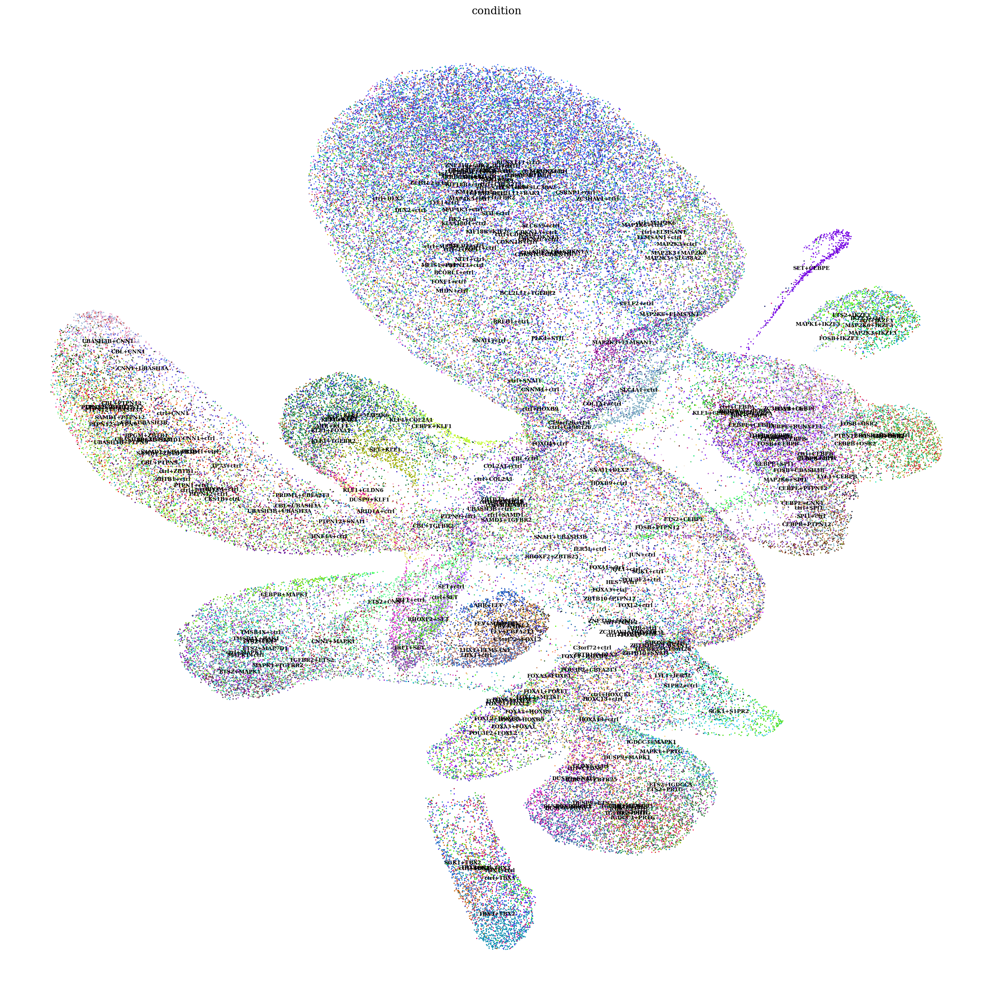

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

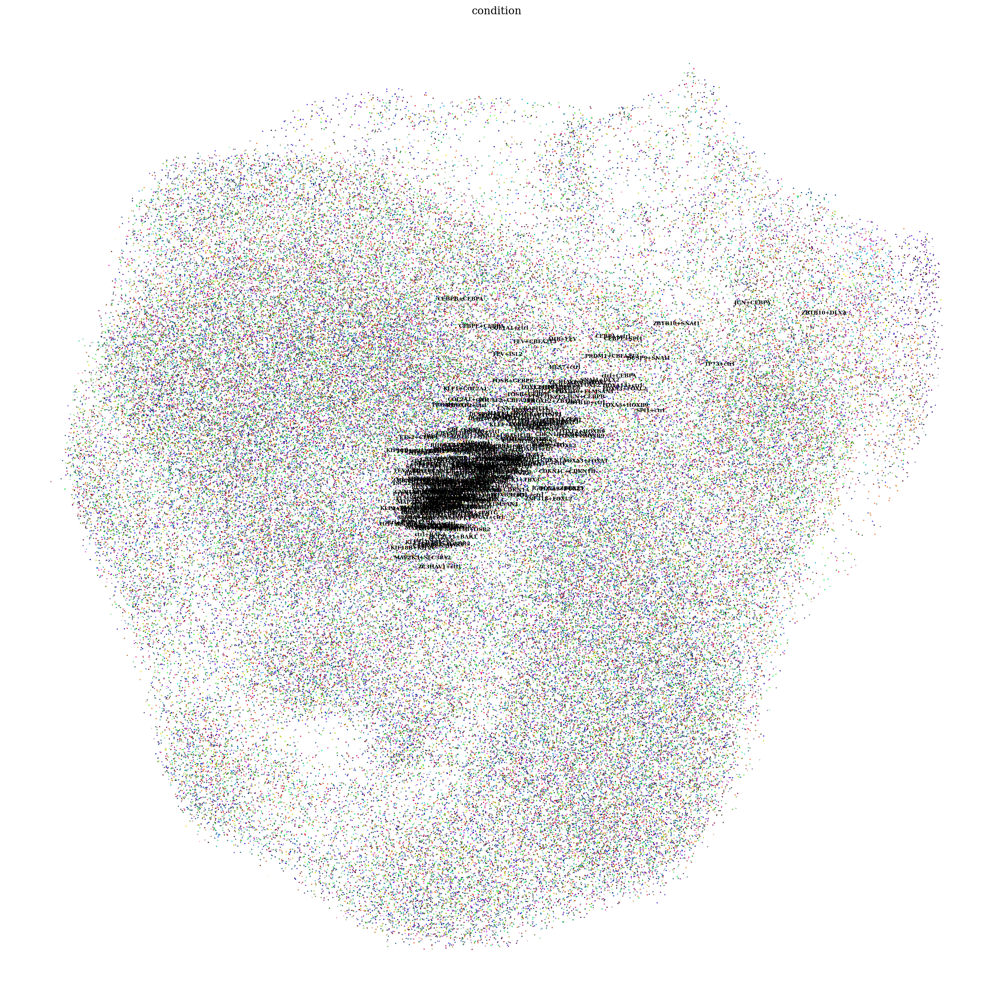

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()